# <strong> Import Library </strong>

In [1]:
import pandas as pd
import numpy as np
import missingno
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler , PowerTransformer , RobustScaler 
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split , cross_val_score , KFold

from lazypredict.Supervised import LazyRegressor
import optuna
from sklearn.linear_model import Ridge, Lasso, LinearRegression 
from sklearn.ensemble import  ExtraTreesRegressor , StackingRegressor , GradientBoostingRegressor 
from sklearn.metrics import root_mean_squared_error , root_mean_squared_log_error

import lightgbm
import xgboost as xgb
import catboost


In [2]:
# DISPLAY ALL COLUMNS DATASET DATAFRAME
pd.set_option('display.max_columns', None) 

# <strong> Load Dataset </strong>

In [3]:
# LOAD DATAFRAME

train_data = pd.read_table(r'../Dataset/train.csv', sep=',')
test_data  = pd.read_table(r'../Dataset/test.csv', sep=',')

print(f'Shape of Train data : {train_data.shape}')
print(f'Shape of Test data  : {test_data.shape}')

Shape of Train data : (1460, 81)
Shape of Test data  : (1459, 80)


In [4]:
# DISPLAY TRAIN DATA

train_data.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.00,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.00,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.00,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.00,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.00,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.00,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.00,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.00,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.00,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.00,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.00,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.00,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.00,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.00,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.00,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
test_data.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.00,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,NaN,0.00,TA,TA,CBlock,TA,TA,No,Rec,468.00,LwQ,144.00,270.00,882.00,GasA,TA,Y,SBrkr,896,0,0,896,0.00,0.00,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.00,Unf,1.00,730.00,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.00,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.00,TA,TA,CBlock,TA,TA,No,ALQ,923.00,Unf,0.00,406.00,1329.00,GasA,TA,Y,SBrkr,1329,0,0,1329,0.00,0.00,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.00,Unf,1.00,312.00,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.00,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.00,TA,TA,PConc,Gd,TA,No,GLQ,791.00,Unf,0.00,137.00,928.00,GasA,Gd,Y,SBrkr,928,701,0,1629,0.00,0.00,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.00,Fin,2.00,482.00,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.00,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.00,TA,TA,PConc,TA,TA,No,GLQ,602.00,Unf,0.00,324.00,926.00,GasA,Ex,Y,SBrkr,926,678,0,1604,0.00,0.00,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.00,Fin,2.00,470.00,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.00,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.00,Gd,TA,PConc,Gd,TA,No,ALQ,263.00,Unf,0.00,1017.00,1280.00,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.00,0.00,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.00,RFn,2.00,506.00,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


## Combine Train and Test Data

In [6]:
combined_data = pd.concat((train_data, test_data), axis=0)

combined_data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.00,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.00,Gd,TA,PConc,Gd,TA,No,GLQ,706.00,Unf,0.00,150.00,856.00,GasA,Ex,Y,SBrkr,856,854,0,1710,1.00,0.00,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.00,RFn,2.00,548.00,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.00
1,2,20,RL,80.00,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.00,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.00,Unf,0.00,284.00,1262.00,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.00,1.00,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.00,RFn,2.00,460.00,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.00
2,3,60,RL,68.00,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.00,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.00,Unf,0.00,434.00,920.00,GasA,Ex,Y,SBrkr,920,866,0,1786,1.00,0.00,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.00,RFn,2.00,608.00,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.00
3,4,70,RL,60.00,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.00,TA,TA,BrkTil,TA,Gd,No,ALQ,216.00,Unf,0.00,540.00,756.00,GasA,Gd,Y,SBrkr,961,756,0,1717,1.00,0.00,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.00,Unf,3.00,642.00,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.00
4,5,60,RL,84.00,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.00,Gd,TA,PConc,Gd,TA,Av,GLQ,655.00,Unf,0.00,490.00,1145.00,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.00,0.00,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.00,RFn,3.00,836.00,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2915,160,RM,21.00,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,2Story,4,7,1970,1970,Gable,CompShg,CemntBd,CmentBd,NaN,0.00,TA,TA,CBlock,TA,TA,No,Unf,0.00,Unf,0.00,546.00,546.00,GasA,Gd,Y,SBrkr,546,546,0,1092,0.00,0.00,1,1,3,1,TA,5,Typ,0,NaN,NaN,NaN,NaN,0.00,0.00,NaN,NaN,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal,NaN
1455,2916,160,RM,21.00,1894,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,TwnhsE,2Story,4,5,1970,1970,Gable,CompShg,CemntBd,CmentBd,NaN,0.00,TA,TA,CBlock,TA,TA,No,Rec,252.00,Unf,0.00,294.00,546.00,GasA,TA,Y,SBrkr,546,546,0,1092,0.00,0.00,1,1,3,1,TA,6,Typ,0,NaN,CarPort,1970.00,Unf,1.00,286.00,TA,TA,Y,0,24,0,0,0,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml,NaN
1456,2917,20,RL,160.00,20000,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1Story,5,7,1960,1996,Gable,CompShg,VinylSd,VinylSd,NaN,0.00,TA,TA,CBlock,TA,TA,No,ALQ,1224.00,Unf,0.00,0.00,1224.00,GasA,Ex,Y,SBrkr,1224,0,0,1224,1.00,0.00,1,0,4,1,TA,7,Typ,1,TA,Detchd,1960.00,Unf,2.00,576.00,TA,TA,Y,474,0,0,0,0,0,NaN,NaN,NaN,0,9,200

# <strong> Exploratory Data Analysis (EDA) </strong>

## Check Information

In [7]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [8]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

## Check Null Values

In [9]:
# NULL VALUES COMPARISON

train_null = train_data.isna().sum()
train_null.drop(labels='SalePrice', axis=0, inplace=True)

test_null  = test_data.isna().sum()

train_null.compare(test_null).sort_values(by='self', ascending=False)

,self,other
PoolQC,1453.00,1456.00
MiscFeature,1406.00,1408.00
Alley,1369.00,1352.00
Fence,1179.00,1169.00
MasVnrType,872.00,894.00
FireplaceQu,690.00,730.00
LotFrontage,259.00,227.00
GarageType,81.00,76.00
GarageYrBlt,81.00,78.00
GarageFinish,81.00,78.00


There are features with many null values ​​and there are also those with only a few null values.

for numeric features, I will try to fill with 0 value

features with few null values, such as Electrical, MsZoning, Functional, KitchenQual, Exterior2nd, Exterior1st, Utilities, SaleType will be handled with mode values , the rest I will replace with the label 'unknown'.

In [10]:
# PERCENTAGE OF MISSING VALUES

# CONVERT TO DATAFRAME
missing_value = pd.DataFrame(data=train_data.isna().sum(), index=train_data.columns, columns=['missing'])

# ADD 'PERCENTAGE' COLUMN
missing_value['Percentage'] = (missing_value['missing'] / 1460) * 100

# SORT BY DESCENDING
missing_value = missing_value.sort_values(by='Percentage',ascending=False)

missing_value.head(20) 

,missing,Percentage
PoolQC,1453,99.52
MiscFeature,1406,96.30
Alley,1369,93.77
Fence,1179,80.75
MasVnrType,872,59.73
FireplaceQu,690,47.26
LotFrontage,259,17.74
GarageYrBlt,81,5.55
GarageCond,81,5.55
GarageType,81,5.55


we can see here, features like PoolQC, Alley, Fence, FireplaceQU, LotFrontage almost all rows are null. we can delete them later

(<Axes: >, <Axes: >)

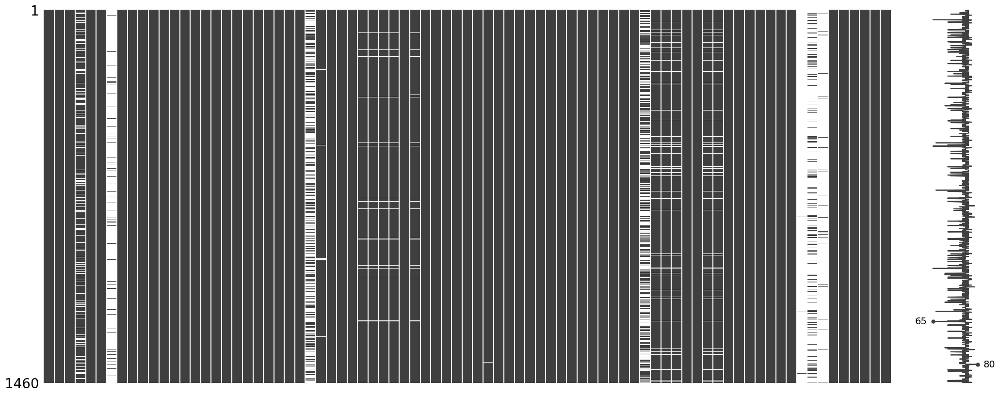

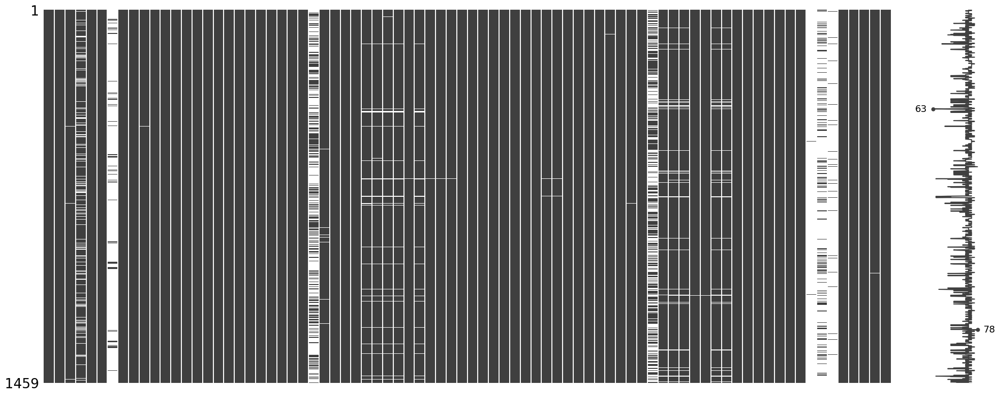

In [11]:
# VISUALIZE MISSING VALUES

missingno.matrix(df= train_data) , missingno.matrix(df= test_data)

(<Axes: >, <Axes: >)

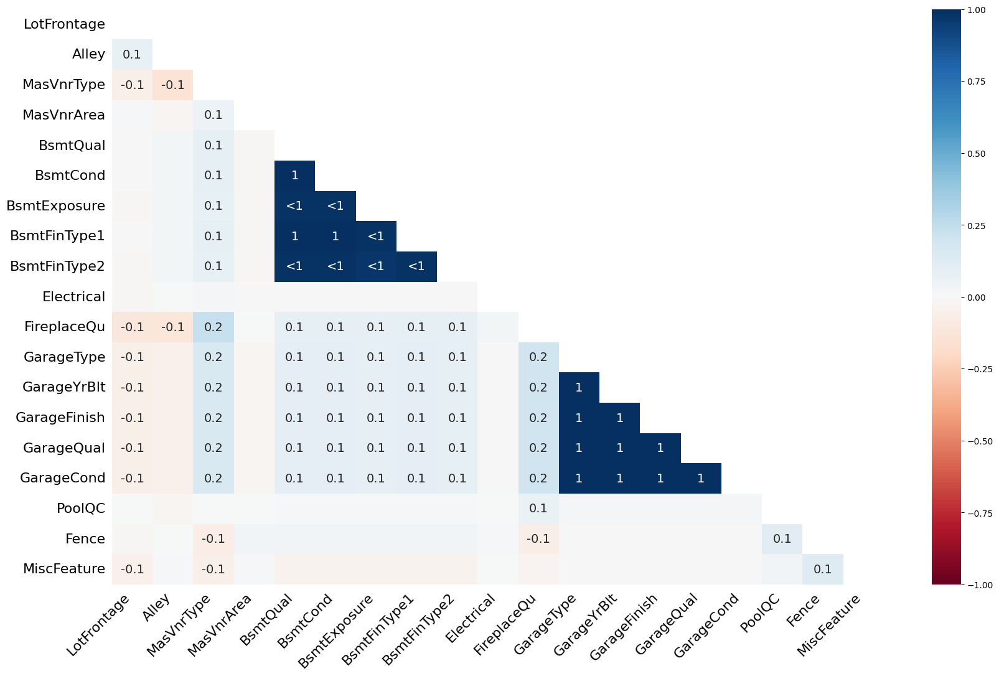

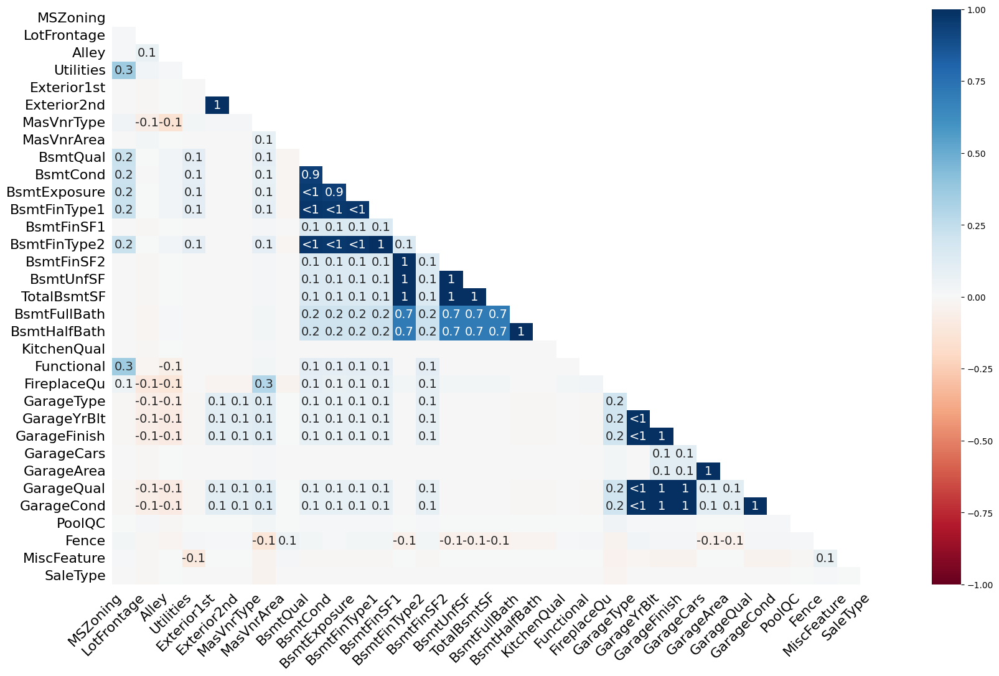

In [12]:
# VISUALIZE NULL VALUES WITH HEATMAP

missingno.heatmap(df= train_data) , missingno.heatmap(df= test_data)

seen in the heatmap, a value close to 1 indicates that if one feature has a missing value, the other features also tend to have a missing value.

## Check Distribution Data

First, we separate the columns that are categorical and numeric.

In [13]:
# SEPARATE FEATURE INTO 3 TYPES OF VARIABLE 

categorical_feature = train_data.select_dtypes(include='object').columns.tolist()

numerical_feature   = train_data.select_dtypes(include=['int64', 'float64']).columns.tolist()
numerical_feature   = [col for col in numerical_feature if col != 'Id' and col != 'SalePrice']

discrete_feature    = [col for col in numerical_feature if len(train_data[col].unique()) < 25]
continuous_feature  = [col for col in numerical_feature if col not in discrete_feature]

print(f'Number of Categorical Feature : {len(categorical_feature)}')
print(f'Number of Numerical Feature   : {len(numerical_feature)}')
print(f'Number of Discrete Feature    : {len(discrete_feature)}')
print(f'Number of Continous Feature   : {len(continuous_feature)}')

Number of Categorical Feature : 43
Number of Numerical Feature   : 36
Number of Discrete Feature    : 18
Number of Continous Feature   : 18


### Comparison Categorical Feature

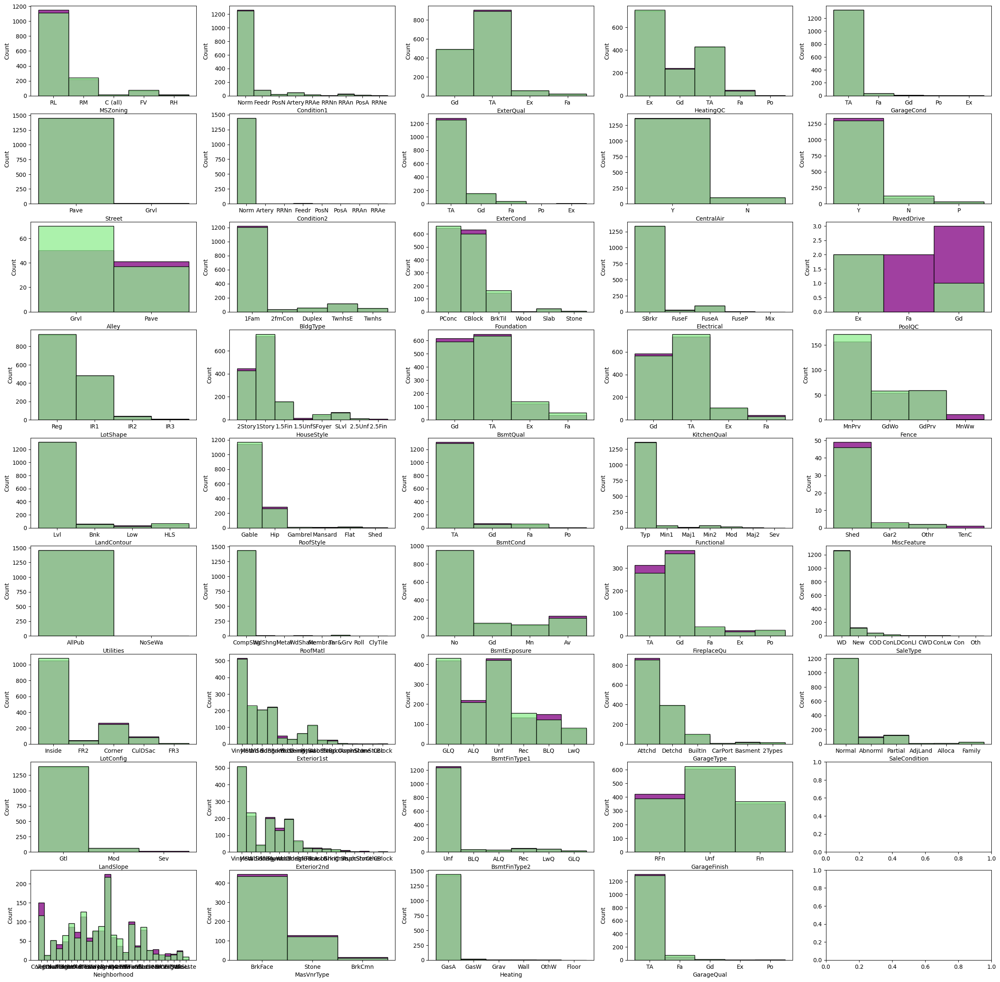

In [14]:
# VISUALIZE DISTRIBUTION OF CATEGORICAL FEATURE

fig , axes = plt.subplots(nrows= 9, ncols=5, figsize=(30,30))

for i, feature in enumerate(categorical_feature):
    sns.histplot(data= train_data, x=feature, ax=axes[i%9, i//9], color='purple')   # DISTRIBUTION FOR TRAIN DATA
    sns.histplot(data= test_data, x=feature, ax=axes[i%9, i//9], color='lightgreen')  # DISTRIBUTION FOR TEST DATA

The data distribution between training data and test data is almost the same, except for PoolQC

Some Feature have Dominants Label ,So we drop features that are only dominated by 1 label, such as RoofMatl, Street, GarageCond, Condition2, Utilities, Heating.

### Comparison Discrete Feature

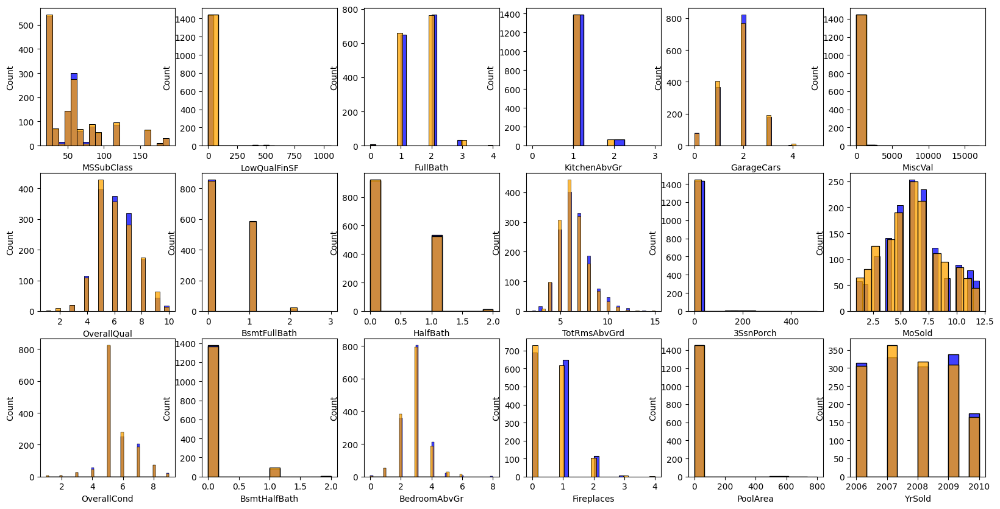

In [15]:
# VISUALIZE DISTRIBUTION OF DISCRETE FEATURE

fig , axes = plt.subplots(nrows=3, ncols=6, figsize=(20,10))

for i , feature in enumerate(discrete_feature):
    sns.histplot(data= train_data, x= feature, ax=axes[i%3, i//3], color='blue')
    sns.histplot(data= test_data,  x= feature, ax=axes[i%3, i//3], color='orange')

plt.show()

some features are dominated by 0 values, such as LowQualFinSF, MiscVal, 3SsnPorch, PoolArea. I will drop those columns

### Comparison Continuous Feature

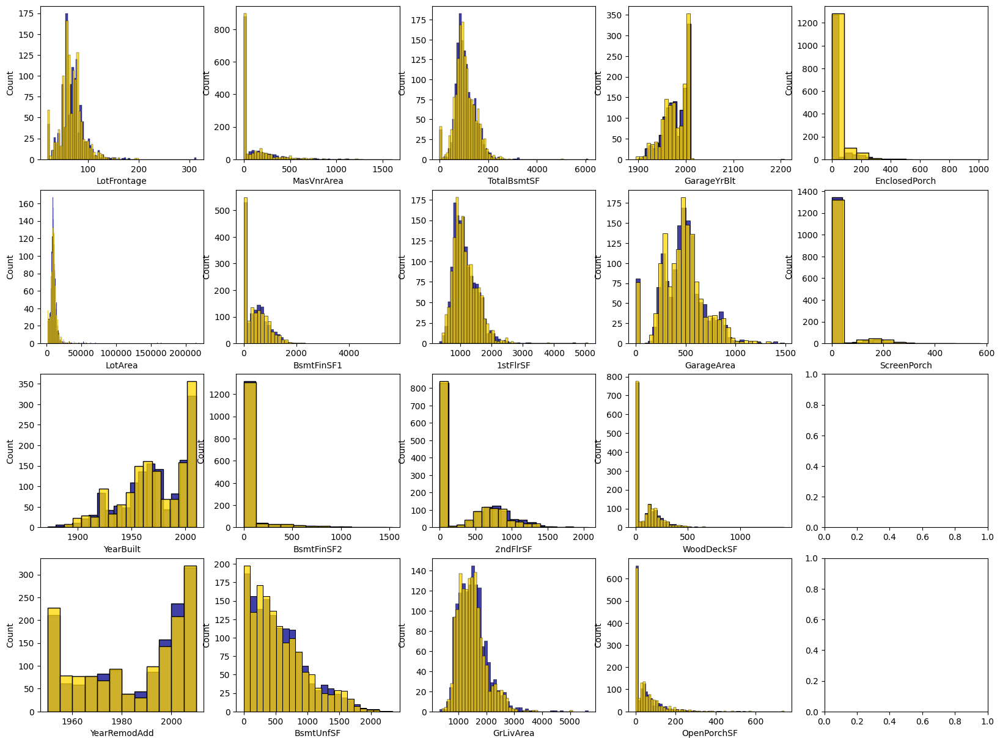

In [16]:
# VISUALIZATION DISTRIBUTION OF CONTINUOUS FEATURE

fig , axes = plt.subplots(nrows=4, ncols=5, figsize=(20,15))

for i, feature in enumerate(continuous_feature):
    sns.histplot(data= train_data, x=feature, ax=axes[i%4, i//4], color='darkblue')
    sns.histplot(data= test_data,  x=feature, ax=axes[i%4,i//4],  color='gold')

plt.show()

some features have a negative skewed distribution

let's calculate how skew it is

In [17]:
# CALCULATE HOW SKEW IT IS

skewness_train = train_data[numerical_feature].skew().sort_values(ascending=False)
skewness_test  = test_data[numerical_feature].skew().sort_values(ascending=False)

avg_skewness = (skewness_train + skewness_test) / 2
avg_skewness = avg_skewness.sort_values(ascending=False)

print(avg_skewness)

MiscVal         22.28
PoolArea        17.51
LowQualFinSF    12.59
3SsnPorch       11.41
LotArea          7.66
KitchenAbvGr     4.28
BsmtFinSF2       4.15
ScreenPorch      3.96
BsmtHalfBath     3.94
EnclosedPorch    3.88
MasVnrArea       2.60
OpenPorchSF      2.53
WoodDeckSF       1.84
1stFlrSF         1.47
BsmtFinSF1       1.43
LotFrontage      1.41
MSSubClass       1.38
GrLivArea        1.25
TotalBsmtSF      1.17
BsmtUnfSF        0.92
2ndFlrSF         0.86
TotRmsAbvGrd     0.76
Fireplaces       0.73
HalfBath         0.70
BsmtFullBath     0.62
OverallCond      0.57
BedroomAbvGr     0.32
GarageArea       0.24
OverallQual      0.20
MoSold           0.20
FullBath         0.17
YrSold           0.13
GarageCars      -0.22
GarageYrBlt     -0.40
YearRemodAdd    -0.45
YearBuilt       -0.60
dtype: float64


any skew value is more than 1 or -1 we will do Transformation

ok now lets check SalePrice distribution

<Axes: xlabel='SalePrice', ylabel='Count'>

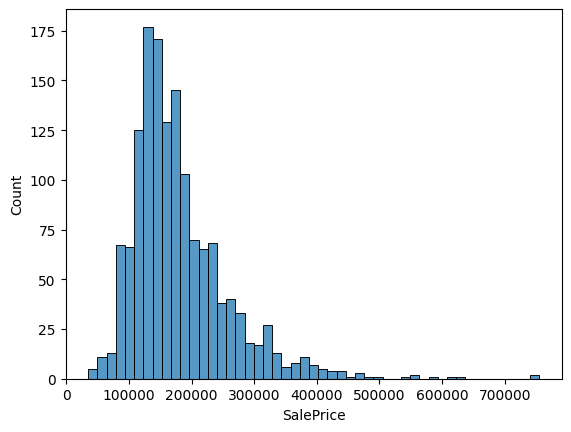

In [18]:
# SALEPRICE DISTRIBUTION

sns.histplot(data=train_data, x='SalePrice')

The distribution of 'SalePrice' shows negative skewness, so we will do a log transformation later.

## Correlation Comparison

<Axes: >

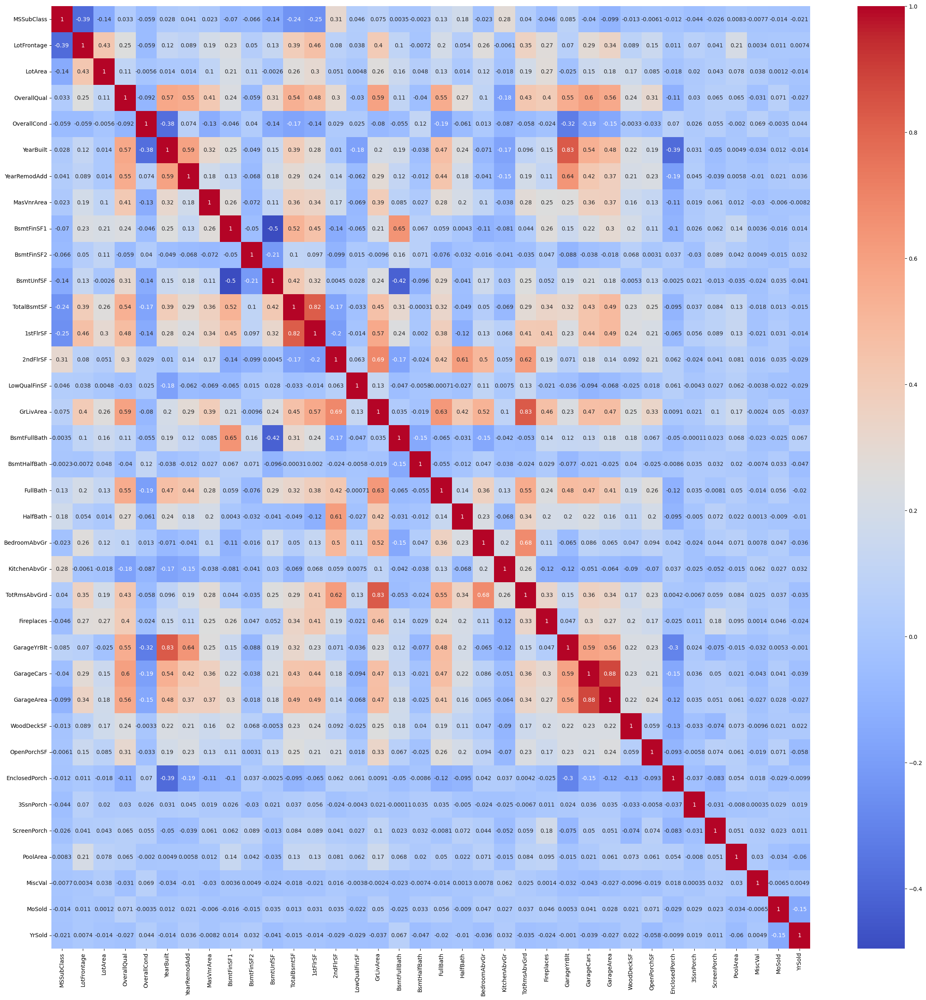

In [19]:
# CHECK CORRELATION EVERY FEATURE

# SET NUMERIC FEATURE
numeric_data = pd.DataFrame()

for feature in numerical_feature:
    numeric_data[feature] = train_data[feature]

corr_data = numeric_data.corr(method='pearson')

plt.figure(figsize=(30,30))
sns.heatmap(data= corr_data, cmap='coolwarm', annot=True, fmt='.2g')

conclusion of correlation:

1. There is a strong correlation between:
    - GarageArea and GarageCars.
    - 1stFlrSF and TotalBsmtSF.
    - GrLivArea and TotRmsAbvGrd.

we can consider removing one of them or using PCA to select the most important features

2. create new features such as:
    - df['GarageEfficiency'] = df['GarageArea'] / df['GarageCars']
    - df['LivabilityScore'] = df['GrLivArea'] + (df['FullBath'] * 2) + (df['HalfBath'])

OK, next we check the correlation with the target features.

<Axes: >

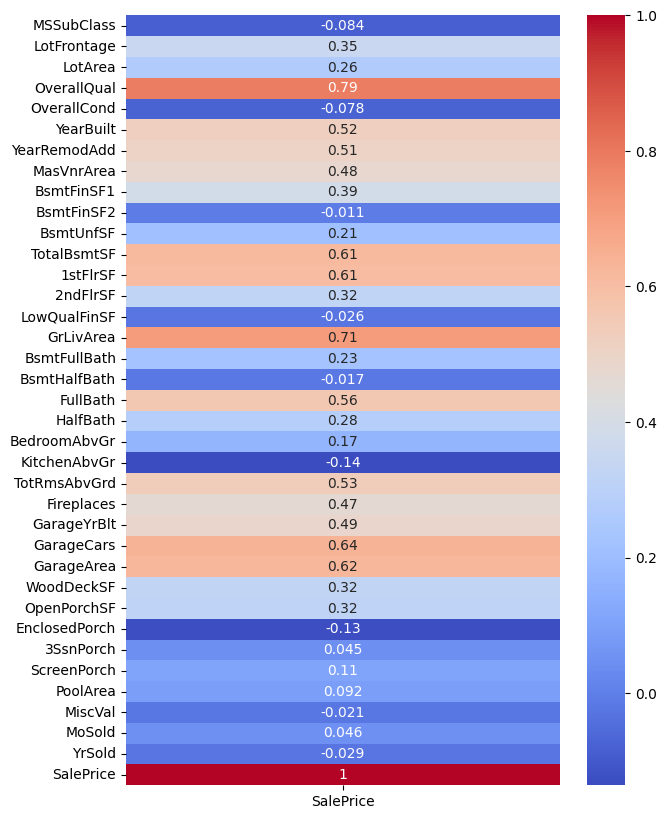

In [20]:
# CORRELATION WITH SALEPRICE

numeric_data['SalePrice'] = train_data['SalePrice']  # ADD SALEPRICE COLUMN

corr_data = numeric_data.corr(method='pearson')
corr_data = corr_data[['SalePrice']]          # ONLY SHOWS CORRELATION FOR SALEPRICE FEATURE


plt.figure(figsize=(7,10))
sns.heatmap(data=corr_data, cmap='coolwarm', annot=True, fmt='.2g')

1. Highly correlated variables with SalePrice(positive, >0.5):

    - OverallQual (0.79) <br>
    - GrLivArea (0.71)  <br>
    - GarageCars (0.64) <br>
    - 1stFlrSF (0.61)   <br>
    - TotalBsmtSF (0.61) <br>
These variables are strong candidates for inclusion in the model because they provide significant information to predict home price. <br> <br>

2. Moderate correlations with SalePrice(0.3–0.5):

    - YearBuilt (0.52) <br>
    - YearRemodAdd (0.51) <br>
    - FullBath (0.56)  <br>
    - Fireplaces (0.47) <br>
    - TotRmsAbvGrd (0.53) <br>
    - MasVnrArea (0.48) <br> 

These variables provide additional information that can help the model improve prediction accuracy, but are not as strong as the highly correlated variables. <br> <br>

3. create new feature TotalArea = GrLivArea + TotalBsmtSF: Adds the area of ​​living space and basement.

ok now check the linearity of the feature against saleprice

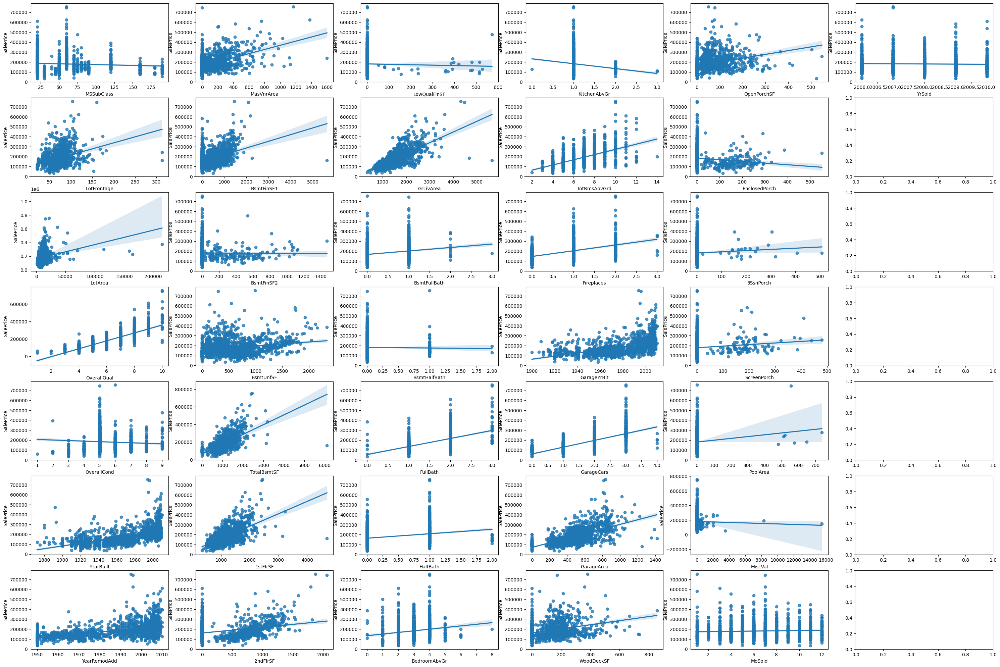

In [21]:
# LINEARITY USING SCATTER PLOT

fig , axes = plt.subplots(nrows=7, ncols=6, figsize=(37,25))

for i , feature in enumerate(numerical_feature):
    sns.regplot(data= train_data, x= feature, y= 'SalePrice', ax= axes[i%7, i//7])

plt.show()


From the data above, there are non-linear relationships such as: <br>
GrLivArea and SalePrice,  <br>
BsmtFinSF1 and SalePrice, <br>
TotalBsmtSF and SalePrice, <br>
LotFrontage and SalePrice, <br>
LotArea and SalePrice,     <br>
GarageArea and SalePrice   <br>


ok next check is there any relation between Yrsold and SalePrice

Text(0.5, 1.0, 'House price vs YearSold')

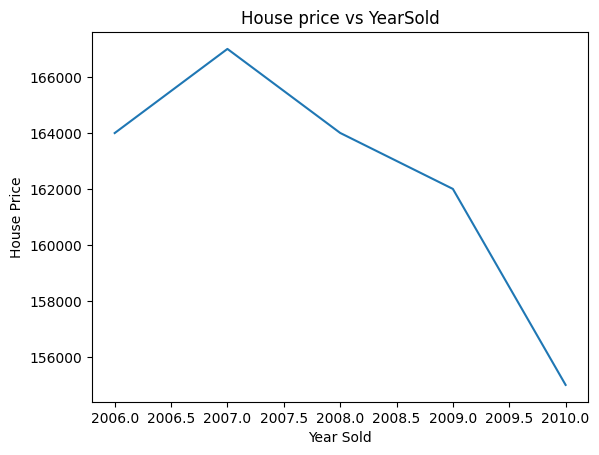

In [22]:
combined_data.groupby('YrSold')['SalePrice'].median().plot()
plt.xlabel('Year Sold')
plt.ylabel('House Price')
plt.title('House price vs YearSold')

There is a negative correlation between YrSold and SalePrice. This means that YrSold has an effect on SalePrice.

# <strong> Feature Engineering </strong>

## Drop Columns

In [23]:

# FIRST DROP COLUMNS WITH MANY NULL VALUES
cols_with_many_null = ['PoolQC', 'Alley', 'Fence', 'FireplaceQu', 'LotFrontage']
combined_data.drop(labels=cols_with_many_null, axis=1, inplace=True)

# NEXT DROP COLUMNS WITH MANY ZERO VALUES
cols_with_many_zero = ['LowQualFinSF', 'MiscVal', '3SsnPorch', 'PoolArea']
combined_data.drop(labels=cols_with_many_zero, axis=1, inplace=True)

# LAST DROP COLUMNS WITH DOMINANT 1 LABEL
cols_with_dominant_label = ['Id','RoofMatl', 'Street', 'Condition2', 'Utilities', 'Heating']
combined_data.drop(labels=cols_with_dominant_label, axis=1, inplace=True)

combined_data.columns  , len(combined_data.columns)   # CHECK FINAL COLUMNS AFTER DROPPED

(Index(['MSSubClass', 'MSZoning', 'LotArea', 'LotShape', 'LandContour',
        'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'BldgType',
        'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
        'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
        'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
        'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
        'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'HeatingQC', 'CentralAir',
        'Electrical', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath',
        'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
        'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageType',
        'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
        'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
        'EnclosedPorch', 'ScreenPorch', 'MiscFeature', 'MoSold', 'YrSold',
        'SaleTyp

## Temporal Variable

Calculating the age of the building, renovations, and year of construction of the garage based on the year of sale

In [24]:
# FIND ALL DATE FEATURE
year_feature = ['YearBuilt', 'YearRemodAdd', 'GarageYrBlt']

for feature in year_feature:
    combined_data[feature] = combined_data['YrSold'] - combined_data[feature]

combined_data[year_feature].head(5) 

,YearBuilt,YearRemodAdd,GarageYrBlt
0,5,5,5.00
1,31,31,31.00
2,7,6,7.00
3,91,36,8.00
4,8,8,8.00


## Fill Missing Values

In [25]:
# FILL NUMERICAL MISSING VALUES WITH ZERO VALUES
numerical_feature = combined_data.select_dtypes(include=['int64', 'float64']).columns.tolist()
for feature in numerical_feature:
    combined_data[feature] = combined_data[feature].fillna(0)

# FILL CONTINUOUS MISSING VALUES 
dropped_cols = cols_with_dominant_label + cols_with_many_null
mode_feature = ['Electrical', 'MsZoning', 'Functional', 'KitchenQual', 'Exterior2nd', 'Exterior1st', 'Utilities', 'SaleType']


for feature in categorical_feature:
    if feature not in dropped_cols:
        if feature not in mode_feature:
            combined_data[feature] = combined_data[feature].fillna('Unknown')
        else:
            combined_data[feature] = combined_data[feature].fillna(combined_data[feature].mode()[0])

In [26]:
# CHECK IT BACK 

combined_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2919 entries, 0 to 1458
Data columns (total 66 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     2919 non-null   int64  
 1   MSZoning       2919 non-null   object 
 2   LotArea        2919 non-null   int64  
 3   LotShape       2919 non-null   object 
 4   LandContour    2919 non-null   object 
 5   LotConfig      2919 non-null   object 
 6   LandSlope      2919 non-null   object 
 7   Neighborhood   2919 non-null   object 
 8   Condition1     2919 non-null   object 
 9   BldgType       2919 non-null   object 
 10  HouseStyle     2919 non-null   object 
 11  OverallQual    2919 non-null   int64  
 12  OverallCond    2919 non-null   int64  
 13  YearBuilt      2919 non-null   int64  
 14  YearRemodAdd   2919 non-null   int64  
 15  RoofStyle      2919 non-null   object 
 16  Exterior1st    2919 non-null   object 
 17  Exterior2nd    2919 non-null   object 
 18  MasVnrType   

## Combining Variables and Create new Feature

In [27]:

# ADD NEW FEATURE 'GarageEfficiency'
combined_data['GarageEfficiency'] = combined_data['GarageArea'] / (combined_data['GarageCars'] + 1)   # +1 TO AVOID DIVISION BY ZERO

# ADD NEW FEATURE 
#combined_data['LivabilityScore'] = combined_data['GrLivArea'] + (combined_data['FullBath'] * 2) + (combined_data['HalfBath'])

# ADD NEW FEATURE TotalArea
combined_data['TotalArea'] = combined_data['GrLivArea'] + combined_data['TotalBsmtSF']

In [28]:
# CHECK NEW FEATURE

combined_data[['GarageEfficiency', 'TotalArea']].head(5)

,GarageEfficiency,TotalArea
0,182.67,2566.00
1,153.33,2524.00
2,202.67,2706.00
3,160.50,2473.00
4,209.00,3343.00


<Axes: >

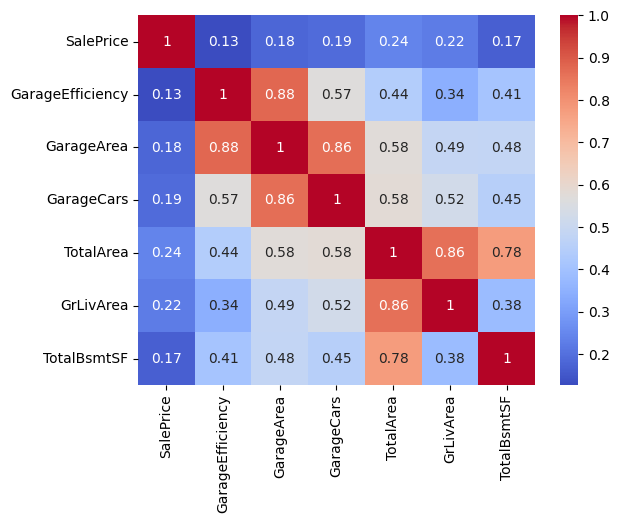

In [29]:
# CHECK CORRELATION OF NEW FEATURE 

new_feature = combined_data[['SalePrice','GarageEfficiency','GarageArea','GarageCars','TotalArea','GrLivArea','TotalBsmtSF']]

corr_new_feature = new_feature.corr(method='spearman')

sns.heatmap(data=corr_new_feature, cmap='coolwarm', annot=True, fmt='.2g')

## Overcome Multicolinearity

In [30]:
# USING PCA TO ADDRESSING MULTICOLINEARITY


zscore = StandardScaler()

# NORMALIZATION
multi_cols_1 = combined_data[['GarageArea','GarageCars']]   # COLUMN THAT HAS MULTICOLINEARITY
multi_cols_1 = zscore.fit_transform(multi_cols_1)

# FIND PRINCIPAL COMPONENT OPTIMAL
pca_1  = PCA(n_components=None)
pca_1.fit_transform(multi_cols_1)


# NORMALIZATION
multi_cols_2 = combined_data[['1stFlrSF', 'TotalBsmtSF']]
multi_cols_2 = zscore.fit_transform(multi_cols_2)

# FIND PRINCIPAL COMPONENT OPTIMAL
pca_2  = PCA(n_components=None)
pca_2.fit_transform(multi_cols_2)


# NORMALIZATION
multi_cols_3 = combined_data[['GrLivArea', 'TotRmsAbvGrd']]
multi_cols_3 = zscore.fit_transform(multi_cols_3)

# FIND PRINCIPAL COMPONENT OPTIMAL
pca_3  = PCA(n_components=None)
pca_3.fit_transform(multi_cols_3)

for pca in [pca_1, pca_2, pca_3]:
    print(f'Number of Components : {pca.n_components_}')
    print(f'Ratio every Component / PC : {pca.explained_variance_ratio_}\n')
    print(f'PCA Components : \n{pca.components_}\n')
    print('---------------------------------')

Number of Components : 2
Ratio every Component / PC : [0.94494511 0.05505489]

PCA Components : 
[[ 0.70710678  0.70710678]
 [ 0.70710678 -0.70710678]]

---------------------------------
Number of Components : 2
Ratio every Component / PC : [0.90068794 0.09931206]

PCA Components : 
[[ 0.70710678  0.70710678]
 [ 0.70710678 -0.70710678]]

---------------------------------
Number of Components : 2
Ratio every Component / PC : [0.90417721 0.09582279]

PCA Components : 
[[ 0.70710678  0.70710678]
 [ 0.70710678 -0.70710678]]

---------------------------------


PC1 explains up to 90%, so we only take PC1

In [31]:
# CHOOSE PC1

pca_1  = PCA(n_components=1)
multi_cols_1 = pca_1.fit_transform(multi_cols_1)

pca_2  = PCA(n_components=1)
multi_cols_2 = pca_2.fit_transform(multi_cols_2)

pca_3  = PCA(n_components=1)
multi_cols_3 = pca_3.fit_transform(multi_cols_3)

# ADD PC1 TO DATAFRAME
combined_data['multi_cols_1'] = multi_cols_1.ravel()
combined_data['multi_cols_2'] = multi_cols_2.ravel()
combined_data['multi_cols_3'] = multi_cols_3.ravel()


In [32]:
combined_data.head(5)

,MSSubClass,MSZoning,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MiscFeature,MoSold,YrSold,SaleType,SaleCondition,SalePrice,GarageEfficiency,TotalArea,multi_cols_1,multi_cols_2,multi_cols_3
0,60,RL,8450,Reg,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,5,5,Gable,VinylSd,VinylSd,BrkFace,196.00,Gd,TA,PConc,Gd,TA,No,GLQ,706.00,Unf,0.00,150.00,856.00,Ex,Y,SBrkr,856,854,1710,1.00,0.00,2,1,3,1,Gd,8,Typ,0,Attchd,5.00,RFn,2.00,548.00,TA,TA,Y,0,61,0,0,Unknown,2,2008,WD,Normal,208500.00,182.67,2566.00,0.46,-0.86,0.99
1,20,RL,9600,Reg,Lvl,FR2,Gtl,Veenker,Feedr,1Fam,1Story,6,8,31,31,Gable,MetalSd,MetalSd,Unknown,0.00,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.00,Unf,0.00,284.00,1262.00,Ex,Y,SBrkr,1262,0,1262,0.00,1.00,2,0,3,1,TA,6,Typ,1,Attchd,31.00,RFn,2.00,460.00,TA,TA,Y,298,0,0,0,Unknown,5,2007,WD,Normal,181500.00,153.33,2524.00,0.18,0.52,-0.54
2,60,RL,11250,IR1,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,7,6,Gable,VinylSd,VinylSd,BrkFace,162.00,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.00,Unf,0.00,434.00,920.00,Ex,Y,SBrkr,920,866,1786,1.00,0.00,2,1,3,1,Gd,6,Typ,1,Attchd,7.00,RFn,2.00,608.00,TA,TA,Y,0,42,0,0,Unknown,9,2008,WD,Normal,223500.00,202.67,2706.00,0.66,-0.64,0.20
3,70,RL,9550,IR1,Lvl,Corner,Gtl,Crawfor,Norm,1Fam,2Story,7,5,91,36,Gable,Wd Sdng,Wd Shng,Unknown,0.00,TA,TA,BrkTil,TA,Gd,No,ALQ,216.00,Unf,0.00,540.00,756.00,Gd,Y,SBrkr,961,756,1717,1.00,0.00,1,0,3,1,Gd,7,Typ,1,Detchd,8.00,Unf,3.00,642.00,TA,TA,Y,0,35,272,0,Unknown,2,2006,WD,Abnorml,140000.00,160.50,2473.00,1.70,-0.83,0.55
4,60,RL,14260,IR1,Lvl,FR2,Gtl,NoRidge,Norm,1Fam,2Story,8,5,8,8,Gable,VinylSd,VinylSd,BrkFace,350.00,Gd,TA,PConc,Gd,TA,Av,GLQ,655.00,Unf,0.00,490.00,1145.00,Ex,Y,SBrkr,1145,1053,2198,1.00,0.00,2,1,4,1,Gd,9,Typ,1,Attchd,8.00,RFn,3.00,836.00,TA,TA,Y,192,84,0,0,Unknown,12,2008,WD,Normal,250000.00,209.00,3343.00,2.34,0.12,2.12


<Axes: >

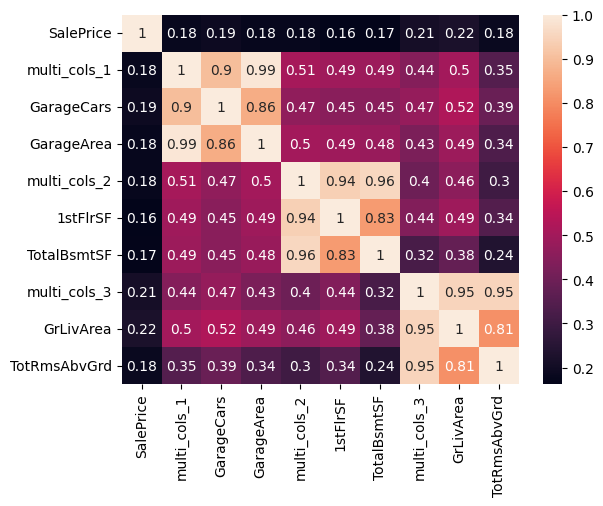

In [33]:
# CHECK BACK HEATMAP

multi = combined_data[['SalePrice', 'multi_cols_1','GarageCars','GarageArea', 'multi_cols_2','1stFlrSF', 'TotalBsmtSF', 'multi_cols_3', 'GrLivArea', 'TotRmsAbvGrd']]

multiq = multi.corr(method='spearman')

sns.heatmap(data=multiq, annot=True, fmt='.2g')

we have successfully overcome multicollinearity, next we drop the multicollinearity feature

In [34]:
# DROP MULTICOLINEARITY FEATURE

multi_corr = ['GarageCars','GarageArea','1stFlrSF', 'TotalBsmtSF','GrLivArea', 'TotRmsAbvGrd']

combined_data.drop(labels= multi_corr, axis=1, inplace=True )

combined_data.head(5)

,MSSubClass,MSZoning,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,HeatingQC,CentralAir,Electrical,2ndFlrSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MiscFeature,MoSold,YrSold,SaleType,SaleCondition,SalePrice,GarageEfficiency,TotalArea,multi_cols_1,multi_cols_2,multi_cols_3
0,60,RL,8450,Reg,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,5,5,Gable,VinylSd,VinylSd,BrkFace,196.00,Gd,TA,PConc,Gd,TA,No,GLQ,706.00,Unf,0.00,150.00,Ex,Y,SBrkr,854,1.00,0.00,2,1,3,1,Gd,Typ,0,Attchd,5.00,RFn,TA,TA,Y,0,61,0,0,Unknown,2,2008,WD,Normal,208500.00,182.67,2566.00,0.46,-0.86,0.99
1,20,RL,9600,Reg,Lvl,FR2,Gtl,Veenker,Feedr,1Fam,1Story,6,8,31,31,Gable,MetalSd,MetalSd,Unknown,0.00,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.00,Unf,0.00,284.00,Ex,Y,SBrkr,0,0.00,1.00,2,0,3,1,TA,Typ,1,Attchd,31.00,RFn,TA,TA,Y,298,0,0,0,Unknown,5,2007,WD,Normal,181500.00,153.33,2524.00,0.18,0.52,-0.54
2,60,RL,11250,IR1,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,7,6,Gable,VinylSd,VinylSd,BrkFace,162.00,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.00,Unf,0.00,434.00,Ex,Y,SBrkr,866,1.00,0.00,2,1,3,1,Gd,Typ,1,Attchd,7.00,RFn,TA,TA,Y,0,42,0,0,Unknown,9,2008,WD,Normal,223500.00,202.67,2706.00,0.66,-0.64,0.20
3,70,RL,9550,IR1,Lvl,Corner,Gtl,Crawfor,Norm,1Fam,2Story,7,5,91,36,Gable,Wd Sdng,Wd Shng,Unknown,0.00,TA,TA,BrkTil,TA,Gd,No,ALQ,216.00,Unf,0.00,540.00,Gd,Y,SBrkr,756,1.00,0.00,1,0,3,1,Gd,Typ,1,Detchd,8.00,Unf,TA,TA,Y,0,35,272,0,Unknown,2,2006,WD,Abnorml,140000.00,160.50,2473.00,1.70,-0.83,0.55
4,60,RL,14260,IR1,Lvl,FR2,Gtl,NoRidge,Norm,1Fam,2Story,8,5,8,8,Gable,VinylSd,VinylSd,BrkFace,350.00,Gd,TA,PConc,Gd,TA,Av,GLQ,655.00,Unf,0.00,490.00,Ex,Y,SBrkr,1053,1.00,0.00,2,1,4,1,Gd,Typ,1,Attchd,8.00,RFn,TA,TA,Y,192,84,0,0,Unknown,12,2008,WD,Normal,250000.00,209.00,3343.00,2.34,0.12,2.12


## Feature Transformation

In [35]:
# APPLY POWER TRANSFORMATION TO FEATURE THAT SKEWNESS VALUE > 1 OR < -1

# SELECT ALL NUMERICAL DATA
transform_data      = combined_data.select_dtypes(include=['int64', 'float64'])
continuous_feature  = [col for col in transform_data if len(transform_data[col].unique()) > 25]    # SELECT ONLY CONTINUOUS FEATURE
transform_data = combined_data[continuous_feature]
transform_data.drop(labels=['SalePrice'], axis=1 , inplace=True)

# CHECK SKEWNESS
skewness = transform_data.skew().sort_values(ascending=False)

# APPLY TRANSFORM FOR FEATURE HAVE SKEWNESS > 1 OR < -1
# cols_to_transform = skewness[(skewness > 1) | (skewness < -1)].index
cols_to_transform = ['LotArea', 'TotalArea', 'TotalArea', 'multi_cols_2', 'BsmtUnfSF']  # CHOSEN FEATURE TO TRANSFORM

for col in cols_to_transform:
    yeo_johnson = PowerTransformer(method='yeo-johnson', standardize=True, copy=True)
    combined_data[[col]] = yeo_johnson.fit_transform(combined_data[[col]])


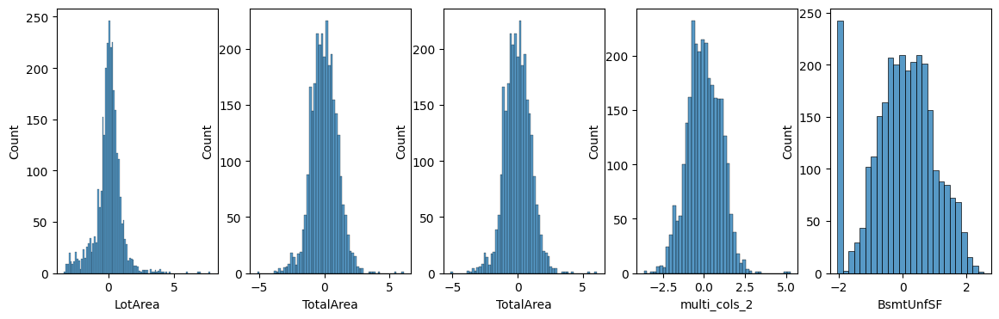

In [36]:
# VISUALIZE AFTER TRANSFORMATION
fig , axes = plt.subplots(nrows=1, ncols=5, figsize=(14,4))

for i , feature in enumerate(cols_to_transform):
    sns.histplot(data=combined_data, x=feature, ax=axes[i%5])

plt.show()

## One Hot Encoder

In [37]:
combined_data = pd.get_dummies(combined_data).reset_index(drop=True)

combined_data

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,2ndFlrSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageYrBlt,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MoSold,YrSold,SalePrice,GarageEfficiency,TotalArea,multi_cols_1,multi_cols_2,multi_cols_3,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,MSZoning_Unknown,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_Stone,MasVnrType_Unknown,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtQual_Unknown,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtCond_Unknown,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_Unknown,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType1_Unknown,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,BsmtFinType2_Unknown,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj1,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_Unknown,GarageFinish_Fin,GarageFinish_RFn,GarageFinish_Unf,GarageFinish_Unknown,GarageQual_Ex,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageQual_Unknown,GarageCond_Ex,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,GarageCond_Unknown,PavedDrive_N,PavedDrive_P,PavedDrive_Y,MiscFeature_Gar2,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,MiscFeature_Unknown,SaleType_COD,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Ab

## Re-Split the Dataset

In [38]:
new_train_data = combined_data.iloc[:len(train_data), :]
new_test_data  = combined_data.iloc[len(train_data):, :]

x_train = new_train_data.drop(labels=['SalePrice'], axis=1)

# LOG TRANSFORMATION FOR TARGET FEATURE (SalePrice)
y_train = np.log1p(new_train_data['SalePrice'])

x_test = new_test_data.drop(labels=['SalePrice'], axis=1)


x_train.shape , y_train.shape, x_test.shape

((1460, 253), (1460,), (1459, 253))

## Feature Scaling

before we do normalization , let's take a look at the data distribution for the last time

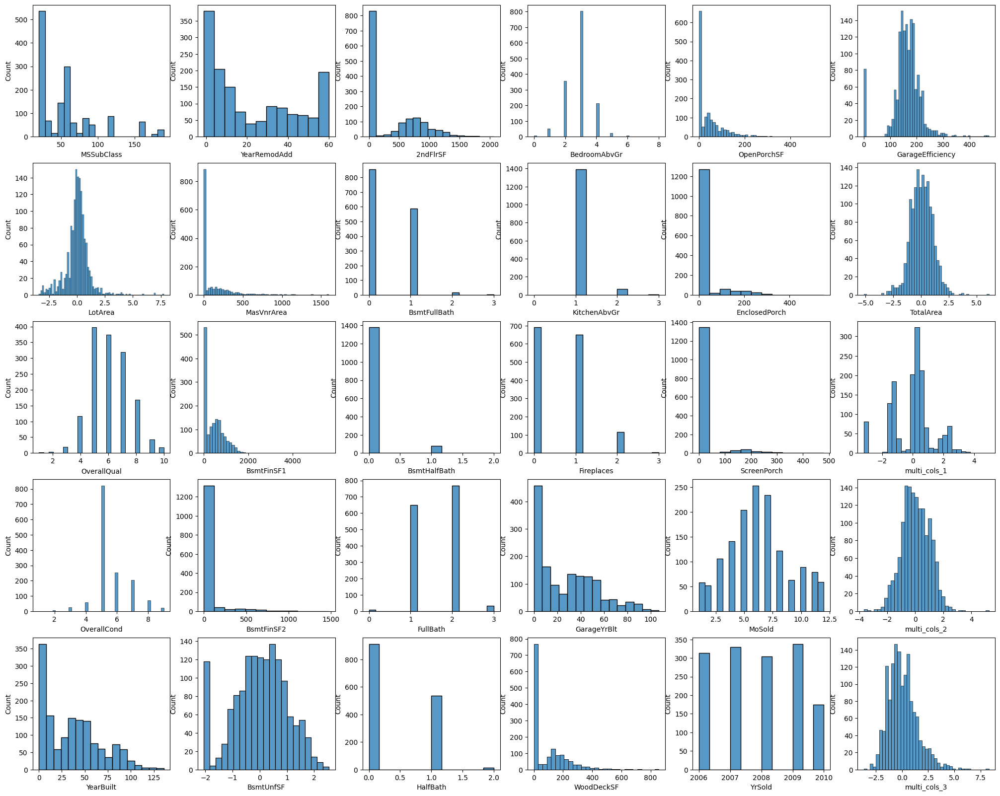

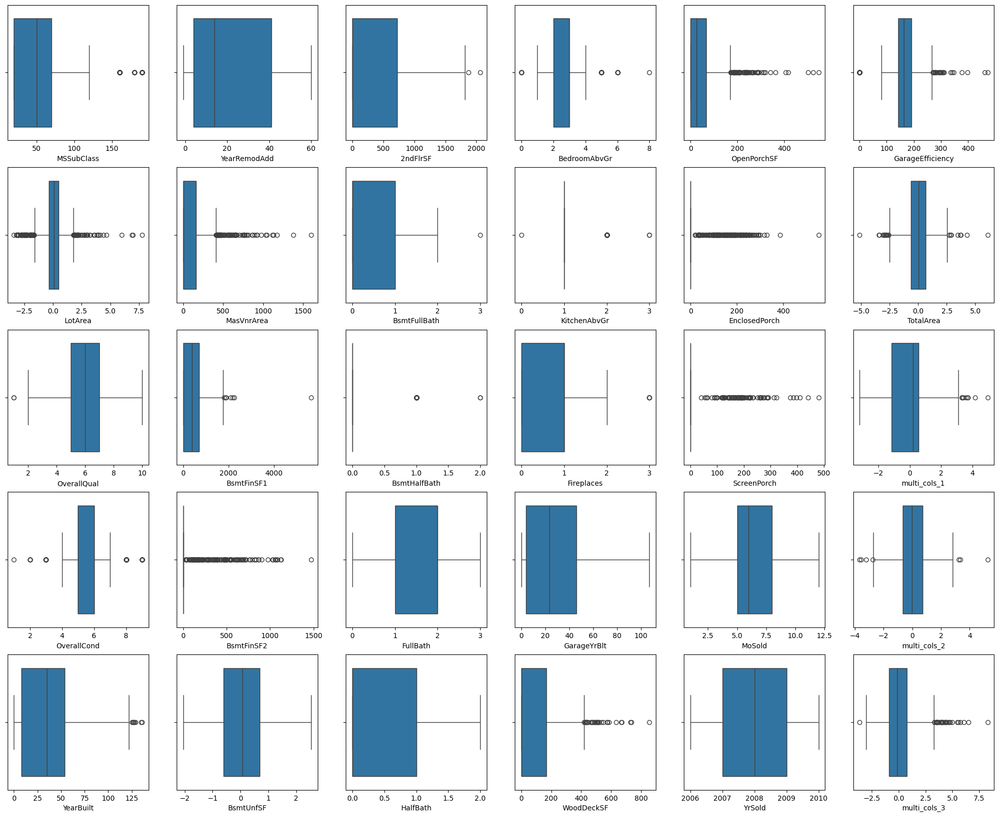

In [39]:

# SELECT ALL NUMERICAL FEATURE
numerical_feature = ['MSSubClass','LotArea','OverallQual','OverallCond','YearBuilt','YearRemodAdd','MasVnrArea','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','2ndFlrSF','BsmtFullBath',
                     'BsmtHalfBath','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','Fireplaces','GarageYrBlt','WoodDeckSF','OpenPorchSF','EnclosedPorch','ScreenPorch',
                     'MoSold','YrSold','GarageEfficiency','TotalArea','multi_cols_1','multi_cols_2','multi_cols_3']


# VISUALIZE IT 
fig, axes = plt.subplots(nrows=5, ncols=6, figsize=(25,20))
for i , feature in enumerate(numerical_feature):
    sns.histplot(data= x_train , x=feature , ax=axes[i%5, i//5])

# BOXPLOT
fig, axes = plt.subplots(nrows=5, ncols=6, figsize=(25,20))
for i,feature in enumerate(numerical_feature):
    sns.boxplot(data=x_train, x=feature, ax=axes[i%5, i//5])

plt.show()

We will perform robust scaling normalization for features that have many outliers and are not normally distributed. and use zscore normalization for features that are almost normally distributed.

In [40]:
# NORMALIZATION

# CHOOSE COLUMNS TO NORMALIZE
cols_to_robust = ['MSSubClass','YearRemodAdd', '2ndFlrSF','BedroomAbvGr','OpenPorchSF','MasVnrArea','EnclosedPorch','BsmtFinSF1','ScreenPorch','BsmtFinSF2','GarageYrBlt','YearBuilt','WoodDeckSF']
cols_to_zscore = ['GarageEfficiency','LotArea','TotalArea','OverallQual','multi_cols_1','OverallCond','multi_cols_2','BsmtUnfSF','multi_cols_3']

# ROBUST SCALING NORM
robust = RobustScaler()
robust.fit(x_train[cols_to_robust])

x_train[cols_to_robust] = robust.transform(x_train[cols_to_robust])
x_test[cols_to_robust]  = robust.transform(x_test[cols_to_robust])

# ZSCORE NORM
zscore = StandardScaler()
zscore.fit(x_train[cols_to_zscore])

x_train[cols_to_zscore] = zscore.transform(x_train[cols_to_zscore])
x_test[cols_to_zscore]  = zscore.transform(x_test[cols_to_zscore])

x_train.shape , x_test.shape

((1460, 253), (1459, 253))

# <strong> Model Development </strong>

## Lazy Predict

In [41]:
# BUILDING LAZY PREDICT TO FIND BEST MODEL

x_train_lazy , x_test_lazy , y_train_lazy , y_test_lazy = train_test_split(x_train, y_train, test_size=0.2, random_state=12, shuffle=True)


lazy_model = LazyRegressor(verbose=0, random_state=12, regressors='all')
train_lazy , test_lazy = lazy_model.fit(x_train_lazy, x_test_lazy, y_train_lazy, y_test_lazy)
test_lazy


  0%|          | 0/42 [00:00<?, ?it/s]

 98%|█████████▊| 41/42 [00:15<00:00,  2.82it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000708 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3034
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 30
[LightGBM] [Info] Start training from score 12.023467


100%|██████████| 42/42 [00:15<00:00,  2.65it/s]


,Adjusted R-Squared,R-Squared,RMSE,Time Taken
Model,,,,
LassoLarsIC,0.11,0.88,0.14,0.06
TransformedTargetRegressor,0.10,0.88,0.14,0.03
LinearRegression,0.10,0.88,0.14,0.03
Ridge,0.10,0.88,0.14,0.03
HistGradientBoostingRegressor,0.10,0.88,0.14,0.94
BayesianRidge,0.10,0.88,0.14,0.05
RidgeCV,0.10,0.88,0.14,0.03
LassoLarsCV,0.10,0.88,0.14,0.10
LassoCV,0.10,0.88,0.14,0.22


we can see above the best algorithm. Ridge and Linear Regression are better compare to each other. we can use them for Stacking-Models. <br>

so, i want use <u>_Linear Model_</u> + <u>_Non-Linear Model_</u> Combination for Stacking Model . <br>

Here my Combination : 
- <strong>Ridge Regression</strong> (Linear Model)
- <strong>Linear Regression</strong>  (Linear Model)
- <strong>Lasso Regression </strong>   (Linear Model)
- <strong>Gradient Boosting Machine </strong>   (Non-Linear Model)
- <strong>XGBoost </strong>  (Non-Linear Model)
- <strong>LightGBM </strong> (Non-Linear Model)
- <strong>CatBoost </strong> (Non-Linear Model)


## Find Best Hyperparameter using Optuna

## Ridge Regression

Find best Alpha and Max_iter for Ridge using Optuna

In [ ]:
def Ridge_objective(trial):

    # SET HYPERPARAMETERS VALUE RANGE
    alpha    = trial.suggest_float('alpha',0.1, 25)
    max_iter = trial.suggest_int('max_iter',150, 2000)

    # SET MODEL
    model = Ridge(alpha=alpha,
                  max_iter=max_iter,
                  random_state=12)
    
    # SCORE METRICS
    score = cross_val_score(estimator= model , X = x_train, y= y_train, scoring='neg_root_mean_squared_error')

    return score.mean()

# BUILD A OPTUNA
#study = optuna.create_study(direction='maximize')
#study.optimize(func= Ridge_objective, n_trials=100)

#print(f'Best CV    : {study.best_params}')
#print(f'Best Score : {study.best_value}')

# GET BEST HYPERPARAMETERS
#ridge_best_params = study.best_params

''' 
Best CV    : {'alpha': 10.92149084623178, 'max_iter': 1112}
Best Score : -0.12549632247936676
'''

''' 
Best CV    : {'alpha': 10.907628470160567, 'max_iter': 685}
Best Score : -0.1254963234836375
'''

fit best hyperparameter and create Ridge model

In [43]:
# BUILD A MODEL

ridge_best_params = {'alpha': 10.907628470160567, 'max_iter': 685}

ridge = Ridge(fit_intercept=True, solver='auto', random_state=12, **ridge_best_params)
ridge.fit(x_train, y_train)


Ridge(alpha=10.907628470160567, max_iter=685, random_state=12)

### Feature Importance for Ridge

In [44]:
# THIS VARIABLE IS TO SEE WHICH FEATURES ARE THE MOST USEFUL AND THE MOST USELESS   

useless_feature = {}   # CAPTURE coefficient VALUE CLOSE TO ZERO
useful_feature  = {}   # CAPTURE HIGH coefficient VALUE

# THIS VARIABLE WILL BE VISUALIZE AT THE END

<BarContainer object of 253 artists>

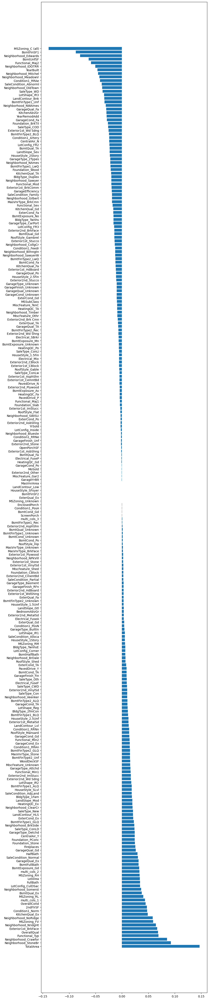

In [45]:
# CHECK FEATURE IMPORTANCES

coefficients = ridge.coef_

features_importance = pd.DataFrame({
    'feature': ridge.feature_names_in_,
    'coefficient': coefficients
})

features_importance = features_importance.sort_values(by='coefficient', ascending=False)

plt.figure(figsize=(10,60))
plt.barh(y=features_importance['feature'], width=features_importance['coefficient'])



lets display coefficient that has value close to 0

In [46]:

features_importance['coefficient'] = abs(features_importance['coefficient'])   # FIRST,CONVERT COEF TO POSITIVE VALUE

zero = features_importance[features_importance['coefficient'] < 0.001 ].sort_values(by='feature', ascending=True)


# PUT CLOSE TO ZERO COEF INTO DICT
for feature in zero['feature']:
    useless_feature[feature] = useless_feature.get(feature,0) + 1



# PUT THE HIGH COEFFICIENT INTO DICT 
threshold = 0.02

   
high_coef = features_importance[features_importance['coefficient'] >= threshold].sort_values(by='coefficient', ascending=False) # SORT IT DESCENDING
high_coef = high_coef.reset_index(drop=True)

for i, feature in enumerate(high_coef['feature']):
    # GIVE VALUE/POINT ACCORDING TO THEIR WEIGHT
    useful_feature[feature] = useful_feature.get(feature, 0) + high_coef['coefficient'][i] # COEFFICIENTS WITH HIGHER WEIGHT WILL GET MORE POINTS/VALUES

# DISPLAY FEATURE THAT HAS VALUE CLOSE TO ZERO
zero


,feature,coefficient
161,BsmtCond_Gd,0.00
8,BsmtFinSF2,0.00
174,BsmtFinType1_Rec,0.00
80,Condition1_PosA,0.00
21,EnclosedPorch,0.00
140,ExterQual_Ex,0.00
129,Exterior2nd_Other,0.00
227,GarageCond_Po,0.00
18,GarageYrBlt,0.00
186,HeatingQC_Gd,0.00


confuse? ok lets print 'useful_feature' variable

In [47]:
useful_feature

{'TotalArea': 0.1468595735224849,
 'MSZoning_C (all)': 0.13871997512972803,
 'Neighborhood_StoneBr': 0.09255942010030366,
 'BsmtFinSF1': 0.0874286936178636,
 'Neighborhood_Crawfor': 0.08518080570573973,
 'Neighborhood_Edwards': 0.07907646641492236,
 'Functional_Typ': 0.06908298085528165,
 'OverallQual': 0.06843295795529113,
 'Exterior1st_BrkFace': 0.06671796365975076,
 'Neighborhood_NridgHt': 0.06428556908160794,
 'BsmtUnfSF': 0.06299668038147634,
 'MSZoning_FV': 0.05915154532265423,
 'Functional_Maj2': 0.05843088528290347,
 'Neighborhood_NoRidge': 0.05822241370422684,
 'Neighborhood_IDOTRR': 0.050439397358985005,
 'KitchenQual_Ex': 0.04900978281201015,
 'Condition1_Norm': 0.04782802494078011,
 '2ndFlrSF': 0.047310360529424174,
 'YearBuilt': 0.046442851678943985,
 'Neighborhood_Mitchel': 0.0452535834439015,
 'OverallCond': 0.044865594122613935,
 'multi_cols_1': 0.04372312443521277,
 'Neighborhood_MeadowV': 0.04269987574744695,
 'Condition1_RRAe': 0.0416511114178628,
 'MSZoning_RL': 0.0

useful_feature.keys() contain name of feature/columns, and useful_feature.values() contains coefficient/weight of features

## Lasso Regression

In [ ]:
def lasso_objective(trial):

    # SET HYPERPARAMETERS VALUE RANGE
    alpha    = trial.suggest_float('alpha',0.1, 25)
    max_iter = trial.suggest_int('max_iter',150, 2000)

    # SET MODEL
    model = Lasso(alpha=alpha,
                  max_iter=max_iter,
                  random_state=10)
    
    # SCORE METRICS
    score = cross_val_score(estimator= model , X = x_train, y= y_train, scoring='neg_root_mean_squared_error')

    return score.mean()


#study = optuna.create_study(direction='maximize')
#study.optimize(func= lasso_objective, n_trials=100)

#print(f'Best CV    : {study.best_params}')
#print(f'Best Score : {study.best_value}')

#lasso_best_params = study.best_params

''' 
Best CV    : {'alpha': 0.10570252247670833, 'max_iter': 1386}
Best Score : -0.21352962715534524 at trial 61
'''

''' 
Best CV    : {'alpha': 0.10064802295354133, 'max_iter': 1839}
Best Score : -0.21014074025313523
'''

In [48]:
lasso_best_params = {'alpha': 0.10064802295354133, 'max_iter': 1839}

# BUILD A MODEL
lasso = Lasso(fit_intercept=True, random_state=12, **lasso_best_params)
lasso.fit(x_train, y_train)

Lasso(alpha=0.10064802295354133, max_iter=1839, random_state=12)

### Feature Importances Lasso Regression

<BarContainer object of 253 artists>

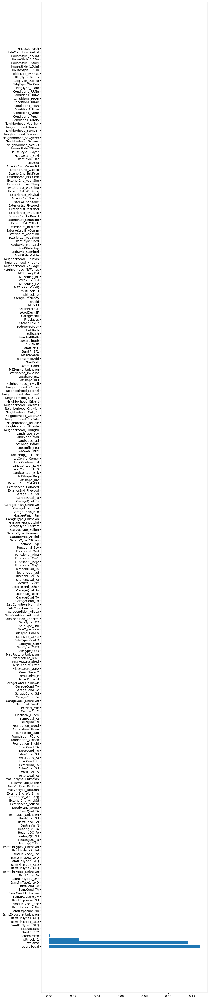

In [49]:
# CHECK FEATURE IMPORTANCES

coefficients = lasso.coef_  # GET WEIGHT / COEFFICIENT

features_importance = pd.DataFrame({
    'feature': lasso.feature_names_in_,
    'coefficient': coefficients
})

features_importance = features_importance.sort_values(by='coefficient', ascending=False)

plt.figure(figsize=(10,60))
plt.barh(y=features_importance['feature'], width=features_importance['coefficient'])


almost all of its features have zero coefficient

In [50]:

features_importance['coefficient'] = abs(features_importance['coefficient'])   # FIRST,CONVERT COEF TO POSITIVE VALUE

zero = features_importance[features_importance['coefficient'] == 0 ].sort_values(by='feature', ascending=True)


# PUT CLOSE TO ZERO COEF INTO DICT
for feature in zero['feature']:
    useless_feature[feature] = useless_feature.get(feature,0) + 1



# PUT THE HIGH COEFFICIENT INTO DICT 
threshold = 0.02

   
high_coef = features_importance[features_importance['coefficient'] >= threshold].sort_values(by='coefficient', ascending=False) # SORT IT DESCENDING
high_coef = high_coef.reset_index(drop=True)

for i, feature in enumerate(high_coef['feature']):
    # GIVE VALUE/POINT ACCORDING TO THEIR WEIGHT
    useful_feature[feature] = useful_feature.get(feature, 0) + high_coef['coefficient'][i] # COEFFICIENTS WITH HIGHER WEIGHT WILL GET MORE POINTS/VALUES

# DISPLAY FEATURE THAT HAS VALUE CLOSE TO ZERO
zero

,feature,coefficient
10,2ndFlrSF,0.00
15,BedroomAbvGr,0.00
86,BldgType_1Fam,0.00
87,BldgType_2fmCon,0.00
88,BldgType_Duplex,0.00
...,...,...
4,YearBuilt,0.00
5,YearRemodAdd,0.00
24,YrSold,0.00
28,multi_cols_2,0.00


## Linear Regression

In [51]:
linear = LinearRegression(fit_intercept=True, positive=False)
linear.fit(x_train, y_train)

LinearRegression()

### Feature Importance for Linear Regression

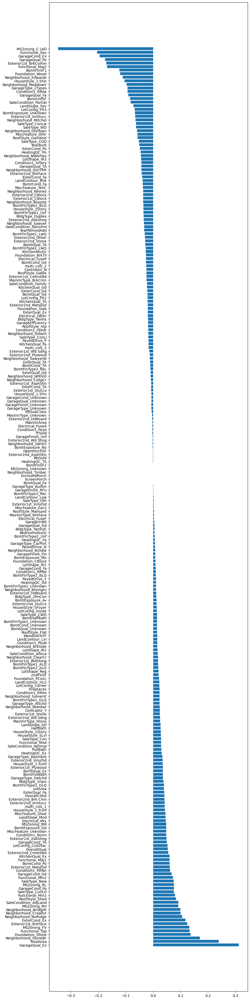

In [ ]:

coefficients = linear.coef_

features_importance = pd.DataFrame({
    'feature' : linear.feature_names_in_,
    'coefficient' : coefficients
})
features_importance = features_importance.sort_values(by='coefficient', ascending=False)  # SORT IT TO DESCENDING

plt.figure(figsize=(10,50))

plt.barh(y=features_importance['feature'], width=features_importance['coefficient'])
plt.show()

show feature with values close to 0

In [52]:
features_importance['coefficient'] = abs(features_importance['coefficient'])   # FIRST,CONVERT COEF TO POSITIVE VALUE

zero = features_importance[features_importance['coefficient'] < 0.001 ].sort_values(by='feature', ascending=True)


# PUT CLOSE TO ZERO COEF INTO DICT
for feature in zero['feature']:
    useless_feature[feature] = useless_feature.get(feature,0) + 1



# PUT THE HIGH COEFFICIENT INTO DICT 
threshold = 0.02

   
high_coef = features_importance[features_importance['coefficient'] >= threshold].sort_values(by='coefficient', ascending=False) # SORT IT DESCENDING
high_coef = high_coef.reset_index(drop=True)

for i, feature in enumerate(high_coef['feature']):
    # GIVE VALUE/POINT ACCORDING TO THEIR WEIGHT
    useful_feature[feature] = useful_feature.get(feature, 0) + high_coef['coefficient'][i] # COEFFICIENTS WITH HIGHER WEIGHT WILL GET MORE POINTS/VALUES

# DISPLAY FEATURE THAT HAS VALUE CLOSE TO ZERO
zero

,feature,coefficient
10,2ndFlrSF,0.00
15,BedroomAbvGr,0.00
86,BldgType_1Fam,0.00
87,BldgType_2fmCon,0.00
88,BldgType_Duplex,0.00
...,...,...
4,YearBuilt,0.00
5,YearRemodAdd,0.00
24,YrSold,0.00
28,multi_cols_2,0.00


## Gradient Boosting Machine

In [ ]:
# GRADIENT BOOSTING MACHINE

def gbr_objective(trial):

    # SET HYPERPARAMETER VALUE RANGE
    n_estimators     = trial.suggest_int('n_estimators', 50,2000)
    learning_rate    = trial.suggest_uniform('learning_rate', 0.001, 1)
    max_depth        = trial.suggest_int('max_depth', 2, 16)
    min_sample_split = trial.suggest_int('min_samples_split', 2, 25)
    max_features     = trial.suggest_int('max_features', 5, 60)
    
    # DECLARATE THE MODEL AND ITS HYPERPARAMETERS
    gbr = GradientBoostingRegressor(
        n_estimators      = n_estimators,
        learning_rate     = learning_rate,
        max_depth         = max_depth,
        min_samples_split = min_sample_split,
        max_features      = max_features,
        random_state      = 12
        )
       
    # CREATE SCORE EVALUATION
    score = cross_val_score(estimator= gbr, X= x_train, y= y_train, scoring='neg_root_mean_squared_error')

    return score.mean()

# BUILD OPTUNA 
#study = optuna.create_study(direction='maximize')

# START TO FIND BEST HYPERPARAMETERS
#study.optimize(func= gbr_objective, n_trials=200)

#print(f'Best Hyperparameter : {study.best_params}')
#print(f'Best Score          : {study.best_value}')

# TAKE THE BEST PARAMETERS
#gbr_best_params = study.best_params

''' 
Best Hyperparameter : {'n_estimators': 1899, 'learning_rate': 0.054138183966776846, 'max_depth': 3, 'min_samples_split': 14, 'max_features': 26}
Best Score          : -0.11692210503959213 at trial 97
'''

''' BEST AT KAGGLE
Best Params : {'n_estimators': 1552, 'learning_rate': 0.03236403825303992, 'max_depth': 3, 'min_samples_split': 14, 'max_features': 46}
Best Score  : -0.11735617999331582 at trial 72
'''


In [53]:
# FIT MODEL GBM

gbr_best_params = {'n_estimators': 1552, 'learning_rate': 0.03236403825303992, 'max_depth': 3, 'min_samples_split': 14, 'max_features': 46}
gbm = GradientBoostingRegressor(random_state=12, **gbr_best_params)
gbm.fit(x_train,y_train)

GradientBoostingRegressor(learning_rate=0.03236403825303992, max_features=46,
                          min_samples_split=14, n_estimators=1552,
                          random_state=12)

### Feature Importance for GBM Model

<BarContainer object of 253 artists>

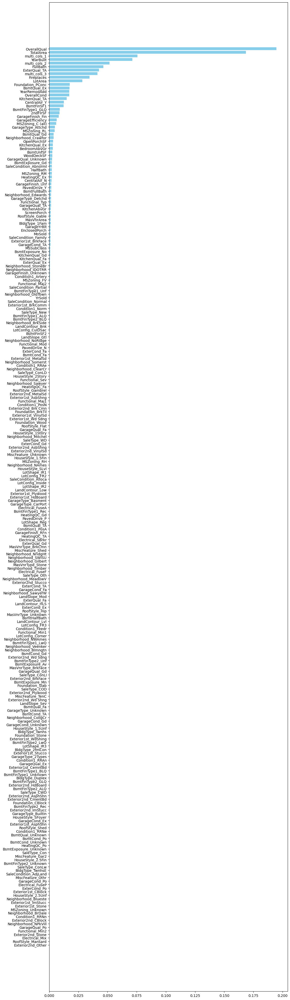

In [54]:

plt.figure(figsize=(12,50))

features_importance = pd.DataFrame({
    'feature' : gbm.feature_names_in_,
    'coefficient' : gbm.feature_importances_
})

features_importance = features_importance.sort_values(by='coefficient', ascending= True)
plt.barh(y= features_importance['feature'], width= features_importance['coefficient'], color='skyblue')

There are too many coefficients that are close to zero, let's display the coefficients that have a value of 0.

In [55]:
features_importance[features_importance['coefficient'] < 0.00001 ].sort_values(by='feature', ascending=True)

,feature,coefficient
88,BldgType_Duplex,0.00
90,BldgType_TwnhsE,0.00
162,BsmtCond_Po,0.00
164,BsmtCond_Unknown,0.00
169,BsmtExposure_Unknown,0.00
176,BsmtFinType1_Unknown,0.00
177,BsmtFinType2_ALQ,0.00
179,BsmtFinType2_GLQ,0.00
181,BsmtFinType2_Rec,0.00
183,BsmtFinType2_Unknown,0.00


In [56]:

zero = features_importance[features_importance['coefficient'] < 0.00001 ].sort_values(by='feature', ascending=True) # SELECT ALL FEATURE THAT WEIGHT < 0.001


# PUT CLOSE TO ZERO COEF INTO DICT
for feature in zero['feature']:
    useless_feature[feature] = useless_feature.get(feature,0) + 1



# PUT THE HIGH COEFFICIENT INTO DICT 
threshold = 0.002

   
high_coef = features_importance[features_importance['coefficient'] >= threshold].sort_values(by='coefficient', ascending=False) # SORT IT DESCENDING
high_coef = high_coef.reset_index(drop=True)

for i, feature in enumerate(high_coef['feature']):
    # GIVE VALUE/POINT ACCORDING TO THEIR WEIGHT
    useful_feature[feature] = useful_feature.get(feature, 0) + high_coef['coefficient'][i] # COEFFICIENTS WITH HIGHER WEIGHT WILL GET MORE POINTS/VALUES

# DISPLAY FEATURE THAT HAS VALUE CLOSE TO ZERO
zero

,feature,coefficient
88,BldgType_Duplex,0.00
90,BldgType_TwnhsE,0.00
162,BsmtCond_Po,0.00
164,BsmtCond_Unknown,0.00
169,BsmtExposure_Unknown,0.00
176,BsmtFinType1_Unknown,0.00
177,BsmtFinType2_ALQ,0.00
179,BsmtFinType2_GLQ,0.00
181,BsmtFinType2_Rec,0.00
183,BsmtFinType2_Unknown,0.00


## XGBoost

In [ ]:
def xg_objective(trial):

    n_estimators    = trial.suggest_int('n_estimators', 100, 2000)
    learning_rate   = trial.suggest_uniform('learning_rate', 0.01, 1)
    max_depth       = trial.suggest_int('max_depth', 2, 20)
    min_child_weight= trial.suggest_float('min_child_weight', 0.4, 10)
    subsample       = trial.suggest_uniform('subsample', 0.35, 1)
    gamma           = trial.suggest_float('gamma', 0.1, 1)
    reg_alpha       = trial.suggest_float('reg_alpha', 0.01, 15)
    reg_lambda      = trial.suggest_float('reg_lambda', 0.01, 15)

    xgboost = xgb.XGBRegressor(
        n_estimators     = n_estimators,
        learning_rate    = learning_rate,
        max_depth        = max_depth,
        min_child_weight = min_child_weight,
        subsample        = subsample,
        gamma            = gamma,
        reg_alpha        = reg_alpha,
        reg_lambda       = reg_lambda,
        random_state     = 12
    )
    
    score = cross_val_score(estimator= xgboost, X = x_train, y = y_train, scoring='neg_root_mean_squared_log_error')

    return score.mean()


#study = optuna.create_study(direction='maximize')
#study.optimize(func= xg_objective, n_trials= 200)

#xgb_best_params = study.best_params

''' 
Best Params : {'n_estimators': 1738, 'learning_rate': 0.10819163170249219, 'max_depth': 19, 'min_child_weight': 1.0918881759107903, 'subsample': 0.46270891531334185,
                'gamma': 0.10028845351448364, 'reg_alpha': 0.3534965264352544, 'reg_lambda': 12.97887001192773}
Best Score  : -0.009996840517023025 at trial 137
'''

In [57]:
xgb_best_params = {'n_estimators': 1552, 'learning_rate': 0.03236403825303992, 'max_depth': 3, 'min_samples_split': 14, 'max_features': 46}

xgboost = xgb.XGBRegressor(random_state=12, **xgb_best_params)
xgboost.fit(x_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.03236403825303992,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_features=46, max_leaves=None,
             min_child_weight=None, min_samples_split=14, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=1552,
             n_jobs=None, ...)

### Feature Importance for XGBoost 

<BarContainer object of 253 artists>

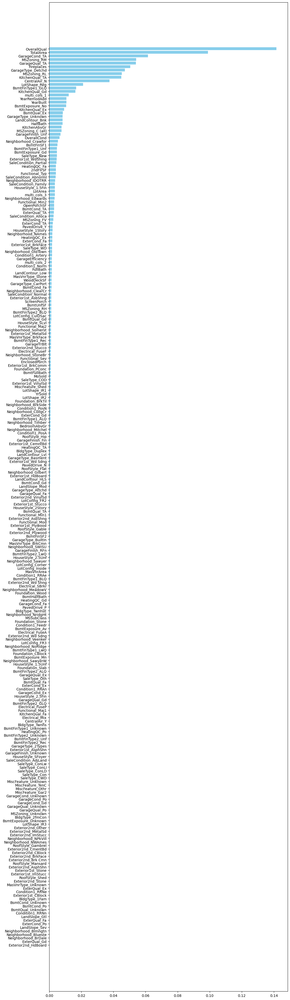

In [58]:
# SHOW FEATURE IMPORTANCES

plt.figure(figsize=(12,50))

features_importance = pd.DataFrame({
    'feature' : xgboost.feature_names_in_,
    'coefficient' : xgboost.feature_importances_
})

features_importance = features_importance.sort_values(by='coefficient', ascending= True)
plt.barh(y= features_importance['feature'], width= features_importance['coefficient'], color='skyblue')

same as GBM , lets show coefficient that has value 0

In [59]:
zero = features_importance[features_importance['coefficient'] == 0 ].sort_values(by='feature', ascending=True) # ALL FEATURE THAT WEIGHT < 0.001


# PUT CLOSE TO ZERO COEF INTO DICT
for feature in zero['feature']:
    useless_feature[feature] = useless_feature.get(feature,0) + 1



# PUT THE HIGH COEFFICIENT INTO DICT 
threshold = 0.01

   
high_coef = features_importance[features_importance['coefficient'] >= threshold].sort_values(by='coefficient', ascending=False) # SORT IT DESCENDING
high_coef = high_coef.reset_index(drop=True)

for i, feature in enumerate(high_coef['feature']):
    # GIVE VALUE/POINT ACCORDING TO THEIR WEIGHT
    useful_feature[feature] = useful_feature.get(feature, 0) + high_coef['coefficient'][i] # COEFFICIENTS WITH HIGHER WEIGHT WILL GET MORE POINTS/VALUES

# DISPLAY FEATURE THAT HAS VALUE CLOSE TO ZERO
zero

,feature,coefficient
86,BldgType_1Fam,0.00
87,BldgType_2fmCon,0.00
89,BldgType_Twnhs,0.00
162,BsmtCond_Po,0.00
164,BsmtCond_Unknown,0.00
...,...,...
239,SaleType_CWD,0.00
240,SaleType_Con,0.00
241,SaleType_ConLD,0.00
242,SaleType_ConLI,0.00


## CatBoost 

In [ ]:
def catboost_objective(trial):

    params = {
        'iterations': trial.suggest_int('iterations', 100, 1000),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 0.1),
        'depth': trial.suggest_int('depth', 3, 10),
        'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-5, 10),
        'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
        'colsample_bylevel': trial.suggest_uniform('colsample_bylevel', 0.5, 1.0),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 100),
        'max_bin': trial.suggest_int('max_bin', 10, 500),
        'eval_metric': 'RMSE', 

    }

    cat = catboost.CatBoostRegressor(**params, random_state=12, verbose=0)

    score = cross_val_score(estimator=cat, X= x_train, y= y_train, scoring='neg_root_mean_squared_error')

    return score.mean()

#study = optuna.create_study(direction='maximize')
#study.optimize(func=catboost_objective, n_trials=50)

#print(f'Best Params : {study.best_params}')
#print(f'Best Scores : {study.best_value}')


#catboost_best_params = study.best_params

''' 
Best Params : {'iterations': 940, 'learning_rate': 0.05397757917685036, 'depth': 4, 'l2_leaf_reg': 9.88267503317357e-05, 'subsample': 0.9616596331860532, 
               'colsample_bylevel': 0.6942581356179441, 'min_data_in_leaf': 61, 'max_bin': 197}
Best Scores : -0.11600213030799092
'''

In [ ]:
catboost_best_params = {'iterations': 940, 'learning_rate': 0.05397757917685036, 'depth': 4, 'l2_leaf_reg': 9.88267503317357e-05, 'subsample': 0.9616596331860532, 
               'colsample_bylevel': 0.6942581356179441, 'min_data_in_leaf': 61, 'max_bin': 197}

cat = catboost.CatBoostRegressor(random_state=12, devices=0,**catboost_best_params)
cat.fit(x_train, y_train)

### Show Feature Importance for CatBoost

<BarContainer object of 253 artists>

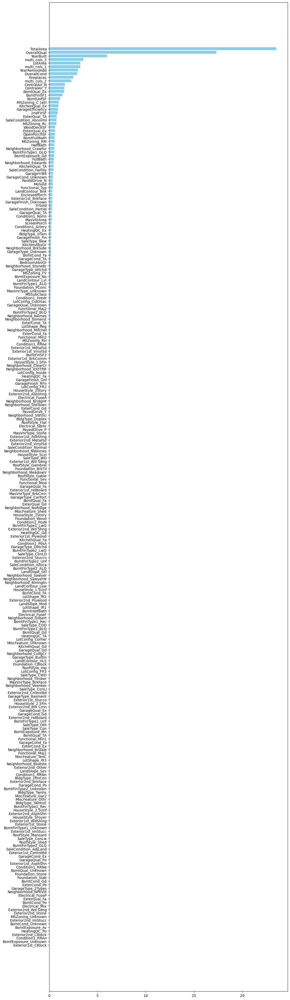

In [61]:
# SHOW FEATURE IMPORTANCES

plt.figure(figsize=(12,50))

features_importance = pd.DataFrame({
    'feature' : x_train.columns,
    'coefficient' : cat.feature_importances_
})

features_importance = features_importance.sort_values(by='coefficient', ascending= True)
plt.barh(y= features_importance['feature'], width= features_importance['coefficient'], color='skyblue')

Display Feature that has coefficient 0

In [62]:
zero = features_importance[features_importance['coefficient'] == 0 ].sort_values(by='feature', ascending=True) # ALL FEATURE THAT WEIGHT < 0.001


# PUT CLOSE TO ZERO COEF INTO DICT
for feature in zero['feature']:
    useless_feature[feature] = useless_feature.get(feature,0) + 1



# PUT THE HIGH COEFFICIENT INTO DICT 
threshold = 0.3

   
high_coef = features_importance[features_importance['coefficient'] >= threshold].sort_values(by='coefficient', ascending=False) # SORT IT DESCENDING
high_coef = high_coef.reset_index(drop=True)

for i, feature in enumerate(high_coef['feature']):
    # GIVE VALUE/POINT ACCORDING TO THEIR WEIGHT
    useful_feature[feature] = useful_feature.get(feature, 0) + high_coef['coefficient'][i] # COEFFICIENTS WITH HIGHER WEIGHT WILL GET MORE POINTS/VALUES

# DISPLAY FEATURE THAT HAS VALUE CLOSE TO ZERO
zero

,feature,coefficient
87,BldgType_2fmCon,0.00
89,BldgType_Twnhs,0.00
90,BldgType_TwnhsE,0.00
161,BsmtCond_Gd,0.00
162,BsmtCond_Po,0.00
164,BsmtCond_Unknown,0.00
165,BsmtExposure_Av,0.00
169,BsmtExposure_Unknown,0.00
176,BsmtFinType1_Unknown,0.00
179,BsmtFinType2_GLQ,0.00


## LightGBM

In [ ]:


# FUNCTION TO FIND BEST HYPERPARAMETER
def lgbm_objective(trial):

    # SET HYPERPARAMETERS VALUE RANGE
    num_leaves        = trial.suggest_int('num_leaves',20,100)
    max_depth         = trial.suggest_int('max_depth', 2, 15)
    learning_rate     = trial.suggest_float('learning_rate', 0.001, 0.8)
    n_estimators      = trial.suggest_int('n_estimators', 100, 2000)
    min_child_weight  = trial.suggest_int('min_child_weight', 0.5, 5)
    min_child_samples = trial.suggest_int('min_child_samples', 7, 20)
    subsample         = trial.suggest_uniform('subsample', 0.4, 1)
    reg_alpha         = trial.suggest_float('reg_alpha', 0.02, 15)
    reg_lambda        = trial.suggest_float('reg_lambda', 0.02, 15)

    # DECLARATE LGBM MODEL
    lgbm = lightgbm.LGBMRegressor(boosting_type    ='gbdt',
                             num_leaves       = num_leaves,
                             max_depth        = max_depth,
                             learning_rate    = learning_rate,
                             n_estimators     = n_estimators,
                             min_child_weight = min_child_weight,
                             min_child_samples= min_child_samples,
                             subsample        = subsample,
                             reg_alpha        = reg_alpha,
                             reg_lambda       = reg_lambda)
    
    # METRICS EVALUATION
    score = cross_val_score(estimator= lgbm, X= x_train, y= y_train, scoring='neg_root_mean_squared_error')

    return score.mean()

# BUILD AND FIT OPTUNA
#study = optuna.create_study(direction='maximize')
#study.optimize(func= lgbm_objective, n_trials=200)

#print(f'Best Params : {study.best_params}')
#print(f'Best Scores : {study.best_value}')

# BEST PARAMS
#lgbm_best_params = study.best_params

''' 
Best Params : {'num_leaves': 92, 'max_depth': 2, 'learning_rate': 0.059514026241983445, 'n_estimators': 1524, 'min_child_weight': 3, 'min_child_samples': 17, 'subsample': 0.48984666486323647, 'reg_alpha': 0.033788563133902494, 'reg_lambda': 4.040907598613931}
Best Scores : -0.1249959965787046
'''

In [ ]:
# BUILD AND FIT MODEL WITH BEST HYPERPARAMETERS

lgbm_best_params = {'num_leaves': 92, 'max_depth': 2, 'learning_rate': 0.059514026241983445, 'n_estimators': 1524, 'min_child_weight': 3, 'min_child_samples': 17,
                    'subsample': 0.48984666486323647, 'reg_alpha': 0.033788563133902494, 'reg_lambda': 4.040907598613931}

lgbm = lightgbm.LGBMRegressor(random_state=12, **lgbm_best_params)
lgbm.fit(x_train, y_train)

### Feature Importance for LGBM

<BarContainer object of 253 artists>

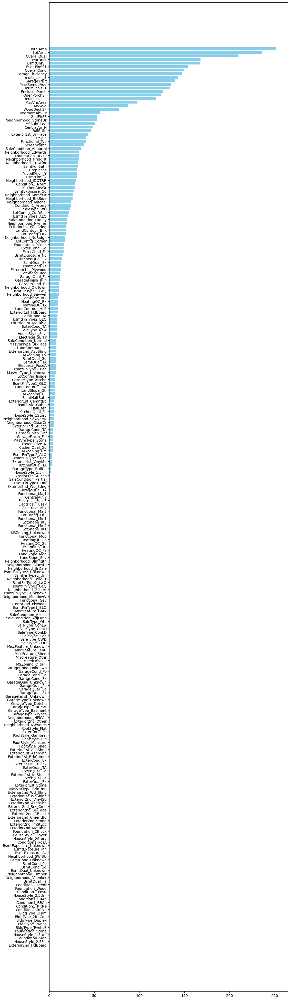

In [64]:
# SHOW FEATURE IMPORTANCES

plt.figure(figsize=(12,50))

features_importance = pd.DataFrame({
    'feature' : lgbm.feature_names_in_,
    'coefficient' : lgbm.feature_importances_
})

features_importance = features_importance.sort_values(by='coefficient', ascending= True)
plt.barh(y= features_importance['feature'], width= features_importance['coefficient'], color='skyblue')

display coefficient that very close to 0

In [65]:
zero = features_importance[features_importance['coefficient'] == 0 ].sort_values(by='feature', ascending=True) # ALL FEATURE THAT WEIGHT < 0.001


# PUT CLOSE TO ZERO COEF INTO DICT
for feature in zero['feature']:
    useless_feature[feature] = useless_feature.get(feature,0) + 1



# PUT THE HIGH COEFFICIENT INTO DICT 
threshold = 1

   
high_coef = features_importance[features_importance['coefficient'] >= threshold].sort_values(by='coefficient', ascending=False) # SORT IT DESCENDING
high_coef = high_coef.reset_index(drop=True)

for i, feature in enumerate(high_coef['feature']):
    # GIVE VALUE/POINT ACCORDING TO THEIR WEIGHT
    useful_feature[feature] = useful_feature.get(feature, 0) + high_coef['coefficient'][i] # COEFFICIENTS WITH HIGHER WEIGHT WILL GET MORE POINTS/VALUES

# DISPLAY FEATURE THAT HAS VALUE CLOSE TO ZERO
zero

,feature,coefficient
86,BldgType_1Fam,0
87,BldgType_2fmCon,0
88,BldgType_Duplex,0
89,BldgType_Twnhs,0
90,BldgType_TwnhsE,0
...,...,...
240,SaleType_Con,0
241,SaleType_ConLD,0
242,SaleType_ConLI,0
243,SaleType_ConLw,0


## Create Stacking Regressor

In [ ]:
cv_fold = KFold(n_splits= 10, shuffle=True, random_state=12)

# CREATE STACKING REGRESSOR
model = StackingRegressor(
    estimators=[
        ('Ridge', ridge),
        ('Lasso', lasso),           
        #('LinearRegression', linear),       # USING LINEAR REGRESSION CAUSE A MODEL GET WORSE
        ('GradientBoostingRegressor', gbm),
        ('xgb', xgboost),
        ('lightgbm', lgbm),
        ('catboost', cat)
    ],
        cv=cv_fold
)

model.fit(x_train, y_train)

OK, now let's visualize which model has the bigger contribution for Meta-Model

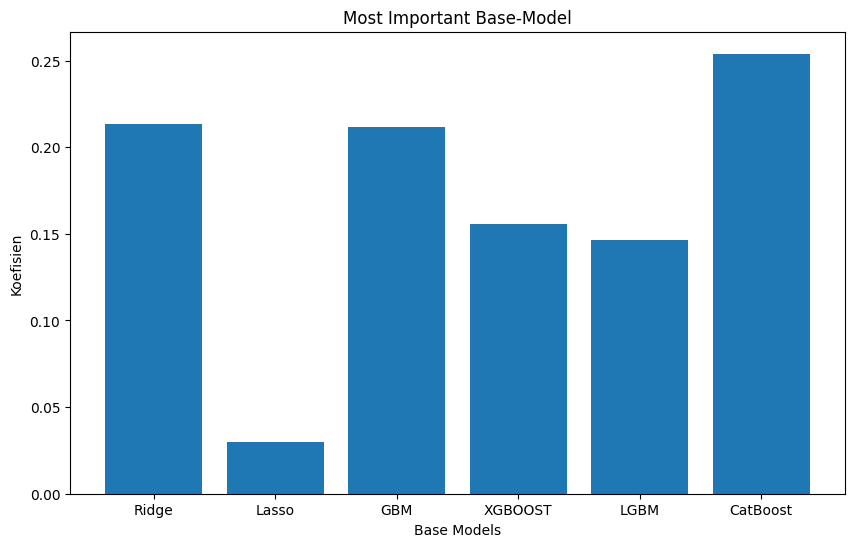

In [67]:
import matplotlib.pyplot as plt

# BASE MODEL WE TRAINED
base_models = [ 'Ridge', 'Lasso', 'GBM', 'XGBOOST', 'LGBM', 'CatBoost']

meta_model = model.final_estimator_
coefficients = meta_model.coef_

plt.figure(figsize=(10,6))
plt.bar(base_models, coefficients)
plt.xlabel('Base Models')
plt.ylabel('Koefisien')
plt.title('Most Important Base-Model')
plt.show()

last thing , we visualize the most useful feature and the most uselesss feature for our model

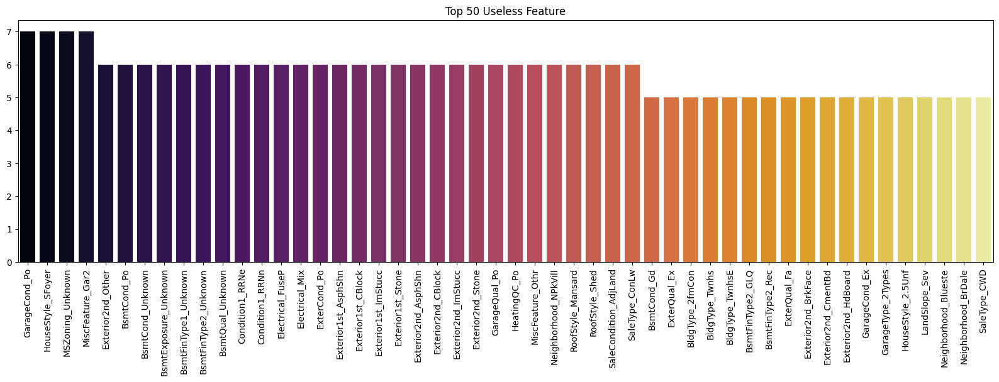

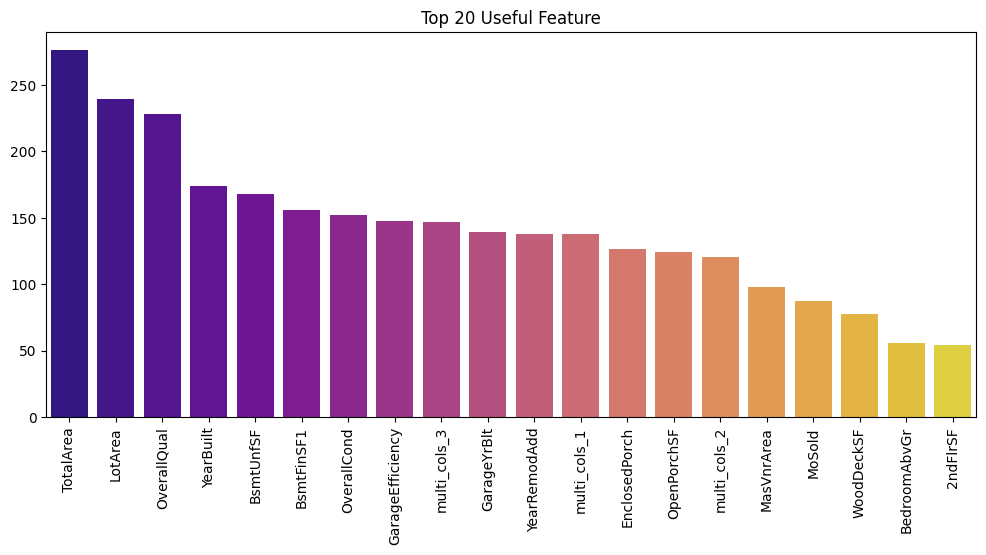

In [68]:

top_50_useless = dict(sorted(useless_feature.items(), key=lambda item: item[1], reverse=True)[:50])
top_20_useful  = dict(sorted(useful_feature.items(), key=lambda item: item[1], reverse=True)[:20])


plt.figure(figsize=(20,5))
sns.barplot(x=top_50_useless.keys(), y=top_50_useless.values(), palette='inferno')
plt.title('Top 50 Useless Feature')
plt.xticks(rotation=90)
plt.show()

plt.figure(figsize=(12,5))
sns.barplot(x=top_20_useful.keys(), y=top_20_useful.values(), palette='plasma')
plt.title('Top 20 Useful Feature')
plt.xticks(rotation=90)
plt.show()

There are many columns/features with the label 'Unknown' which are useless, such as 'MSZoning_Unknown' , 'BsmtCond_Unknown' , 'BsmtExposure_Unknown', 'BsmtFinType1_Unknown', 'BsmtFinType2_Unknown', 'BsmtQual_Unknown' . This shows that filling null values ​​with 'Unknown' values ​​(in categorical data) is very bad.

in the future i want to improve it and do retraining with the best selected features

In [ ]:
# PREDICT MODEL AND SAVE SUBMISSION

y_pred = np.expm1(model.predict(x_test))

submission = pd.read_table(r'')   # LOAD SAMPLE SUBMISSION CSV

output = pd.DataFrame(y_pred, columns=['SalePrice'])
output = pd.concat([submission.iloc[:,0] , output], axis=1)
output.rename(columns={output.columns[0] : 'Id'}, inplace=True)
output.to_csv('submission.csv', index=False)

<h5><strong style='color:skyblue;'> Thank you for reading this notebook till the end. Please upvote if you find it helpful. Thank You :) 